In [1]:
%matplotlib inline
import pandas as pd
"""
Demo using fontdict to control style of text and labels.
"""
import numpy as np
import matplotlib.pyplot as plt
import datetime as dt

idx = pd.IndexSlice



In [2]:
poblacion = pd.read_csv('https://raw.githubusercontent.com/rchorda/covid/master/demo_r_d2jan_1_Data.csv',sep=';',index_col=['Flag and Footnotes'])

In [3]:
dateparse = lambda x: pd.datetime.strptime(x, '%d/%m/%y')
#datos = pd.read_csv('https://covid19.isciii.es/resources/serie_historica_acumulados.csv',
datos = pd.read_csv('https://cnecovid.isciii.es/covid19/resources/agregados.csv',
            encoding = "ISO-8859-1",skipfooter=9,#nrows=1738,
            index_col=[1,0],
            parse_dates=[1],
            infer_datetime_format=True,
            engine='python',
            #date_parser=dateparse,
            #dayfirst=True,# yearfirst=False
            )#[:-5]
#datos.sort_index([0,1])
#datos.sort_values(['CCAA','FECHA'],inplace=True)

datos.tail(15)

CASOS   PCR+  TestAc+  Hospitalizados     UCI  Fallecidos
FECHA      CCAA                                                           
2020-05-20 CN      NaN   2307      0.0           944.0   179.0       155.0
           CB      NaN   2279    519.0          1036.0    79.0       209.0
           CM      NaN  16789   8634.0          9138.0   639.0      2919.0
           CL      NaN  18627   6291.0          8735.0   561.0      1960.0
           CT      NaN  55888   1643.0         29497.0  2969.0      6021.0
           CE      NaN    119     59.0            11.0     4.0         4.0
           VC      NaN  10987   3810.0          5747.0   730.0      1383.0
           EX      NaN   3042   1001.0          1780.0   110.0       505.0
           GA      NaN   9077   2026.0          2943.0   334.0       608.0
           MD      NaN  67049   5293.0         42497.0  3617.0      8931.0
           ML      NaN    121     13.0            44.0     3.0         2.0
           MC      NaN   1570   1039.0           680.0   112.0       149.0
           NC      NaN   5195   3157.0          2048.0   136.0       506.0
           PV      NaN  13421   5358.0          7032.0   578.0      1483.0
           RI      NaN   4033   1395.0          1504.0    91.0       354.0

In [4]:
#datos = datos[:-8]
#display(datos.loc[idx['2020-04-28','GA'],:])
datos.loc[idx['2020-04-28','GA'],'CASOS'] = np.nan
#kk = datos.at[idx['2020-04-28','GA'],'Fallecidos'] - 125
#datos.loc[idx['2020-04-28','GA'],'Fallecidos'] = kk

datos.loc[:,'Total'] = datos['CASOS']
datos.loc[:,'Total'] = datos.Total.fillna(datos['PCR+'])
#datos['Total'] = datos[['CASOS','PCR+']].sum(axis=1)
datos.loc[:,'DTotal'] = datos.Total.groupby(by='CCAA').diff()
datos.loc[:,'DFallecidos'] = datos.Fallecidos.groupby(by='CCAA').diff()
#datos.loc[:,'DRecuperados'] = datos.Recuperados.groupby(by='CCAA').diff()
datos.tail(38)
#datos.loc[idx['2020-04-28':]]

CASOS   PCR+  TestAc+  Hospitalizados     UCI  Fallecidos  \
FECHA      CCAA                                                              
2020-05-19 AN      NaN  12502   3999.0          6196.0   764.0      1371.0   
           AR      NaN   5551   1751.0          2434.0   255.0       847.0   
           AS      NaN   2374    985.0          1089.0   121.0       304.0   
           IB      NaN   2016    106.0          1142.0   168.0       221.0   
           CN      NaN   2300      0.0           943.0   179.0       155.0   
           CB      NaN   2277    510.0          1036.0    79.0       209.0   
           CM      NaN  16739   8546.0          9122.0   639.0      2913.0   
           CL      NaN  18586   6290.0          8734.0   555.0      1960.0   
           CT      NaN  55888   1643.0         29497.0  2969.0      6021.0   
           CE      NaN    119     59.0            11.0     4.0         4.0   
           VC      NaN  10949   3810.0          5742.0   727.0      1378.0   
           EX      NaN   3040   1001.0          1780.0   110.0       504.0   
           GA      NaN   9067   2014.0          2939.0   334.0       607.0   
           MD      NaN  66967   5293.0         42422.0  3610.0      8912.0   
           ML      NaN    121     13.0            44.0     3.0         2.0   
           MC      NaN   1560   1039.0           679.0   112.0       148.0   
           NC      NaN   5192   3157.0          2048.0   136.0       503.0   
           PV      NaN  13412   5358.0          7024.0   578.0      1480.0   
           RI      NaN   4033   1395.0          1499.0    91.0       353.0   
2020-05-20 AN      NaN  12547   3999.0          6210.0   766.0      1375.0   
           AR      NaN   5588   1751.0          2442.0   256.0       848.0   
           AS      NaN   2374    985.0          1089.0   121.0       307.0   
           IB      NaN   2024    107.0          1144.0   169.0       221.0   
           CN      NaN   2307      0.0           944.0   179.0       155.0   
           CB      NaN   2279    519.0          1036.0    79.0       209.0   
           CM      NaN  16789   8634.0          9138.0   639.0      2919.0   
           CL      NaN  18627   6291.0          8735.0   561.0      1960.0   
           CT      NaN  55888   1643.0         29497.0  2969.0      6021.0   
           CE      NaN    119     59.0            11.0     4.0         4.0   
           VC      NaN  10987   3810.0          5747.0   730.0      1383.0   
           EX      NaN   3042   1001.0          1780.0   110.0       505.0   
           GA      NaN   9077   2026.0          2943.0   334.0       608.0   
           MD      NaN  67049   5293.0         42497.0  3617.0      8931.0   
           ML      NaN    121     13.0            44.0     3.0         2.0   
           MC      NaN   1570   1039.0           680.0   112.0       149.0   
           NC      NaN   5195   3157.0          2048.0   136.0       506.0   
           PV      NaN  13421   5358.0          7032.0   578.0      1483.0   
           RI      NaN   4033   1395.0          1504.0    91.0       354.0   

                   Total  DTotal  DFallecidos  
FECHA      CCAA                                
2020-05-19 AN    12502.0    13.0          4.0  
           AR     5551.0    31.0          4.0  
           AS     2374.0     1.0          1.0  
           IB     2016.0    13.0          2.0  
           CN     2300.0     6.0          0.0  
           CB     2277.0     4.0          1.0  
           CM    16739.0    62.0         13.0  
           CL    18586.0    37.0          0.0  
           CT    55888.0    63.0         40.0  
           CE      119.0     2.0          0.0  
           VC    10949.0    22.0          2.0  
           EX     3040.0     2.0          0.0  
           GA     9067.0     9.0          0.0  
           MD    66967.0   139.0         18.0  
           ML      121.0     0.0          0.0  
           MC     1560.0     2.0          3.0  
           NC     5192.0     9.0

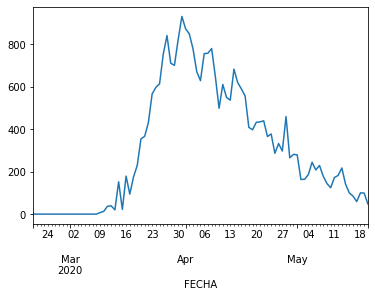

In [5]:
datos.groupby('FECHA').sum().DFallecidos.plot()

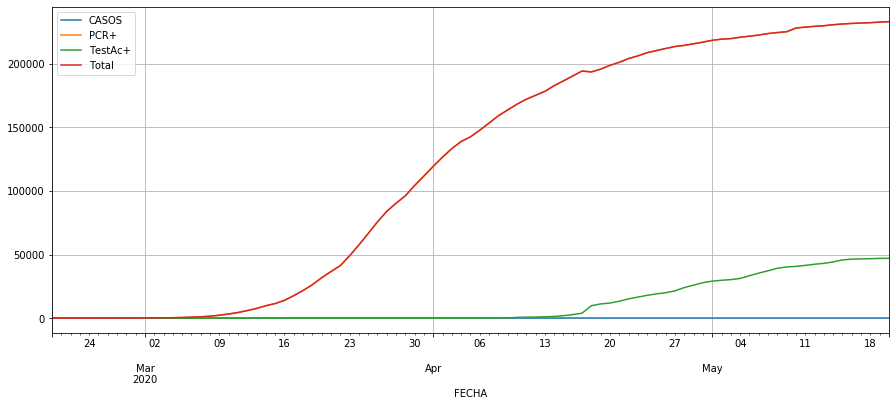

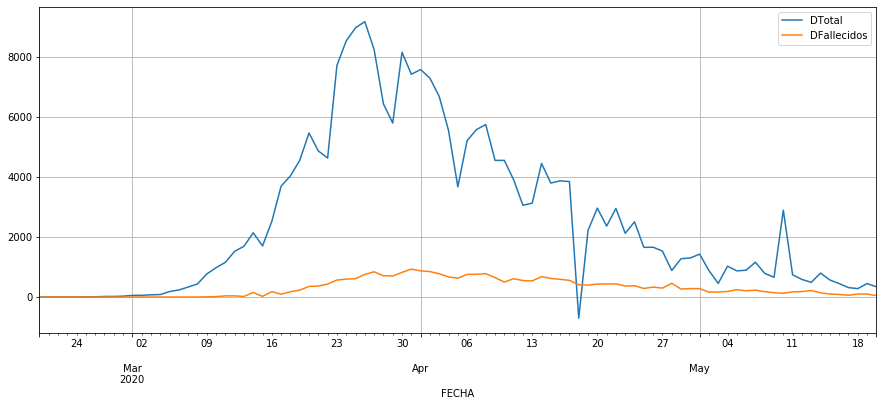

In [6]:
kv = datos.groupby('FECHA').sum()#.loc['AR']#.dropna()
#kv['Total'] = kv[['CASOS','PCR+']].sum(axis=1)
#kv['DTotal'] = np.gradient(kv.Total)
#kv['DFallecidos'] = np.gradient(kv.Fallecidos)
#kv['DRecuperados'] = np.gradient(kv.Recuperados)

fig, ax = plt.subplots(figsize=(15,6))
kv[['CASOS']].plot(ax=ax)
kv[['PCR+']].plot(ax=ax)
kv[['TestAc+']].plot(ax=ax)
kv[['Total']].plot(ax=ax)
plt.grid()
plt.show()


fig, ax = plt.subplots(figsize=(15,6))
kv[['DTotal']].plot(ax=ax)
kv[['DFallecidos']].plot(ax=ax)
#kv[['DRecuperados']].plot(ax=ax)
plt.grid()

In [7]:
kv

,CASOS,PCR+,TestAc+,Hospitalizados,UCI,Fallecidos,Total,DTotal,DFallecidos
FECHA,,,,,,,,,
2020-02-20,0.0,3,0.0,26.0,0.0,0.0,3.0,0.0,0.0
2020-02-21,0.0,3,0.0,30.0,1.0,0.0,3.0,0.0,0.0
2020-02-22,0.0,3,0.0,33.0,1.0,0.0,3.0,0.0,0.0
2020-02-23,0.0,3,0.0,38.0,2.0,0.0,3.0,0.0,0.0
2020-02-24,0.0,4,0.0,49.0,2.0,0.0,4.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
2020-05-16,0.0,231651,46369.0,123835.0,11378.0,27634.0,231651.0,448.0,85.0
2020-05-17,0.0,231966,46582.0,123991.0,11391.0,27693.0,231966.0,315.0,59.0
2020-05-18,0.0,232246,46766.0,124421.0,11403.0,27793.0,232246.0,280.0,100.0


Relación entre los casos detectados y los Fallecimientos
---------------

Ambas gráficas se superponen bastante bien si las decalamos siete días y consideramos una mortalidad del 12% respecto a los casos detectados:

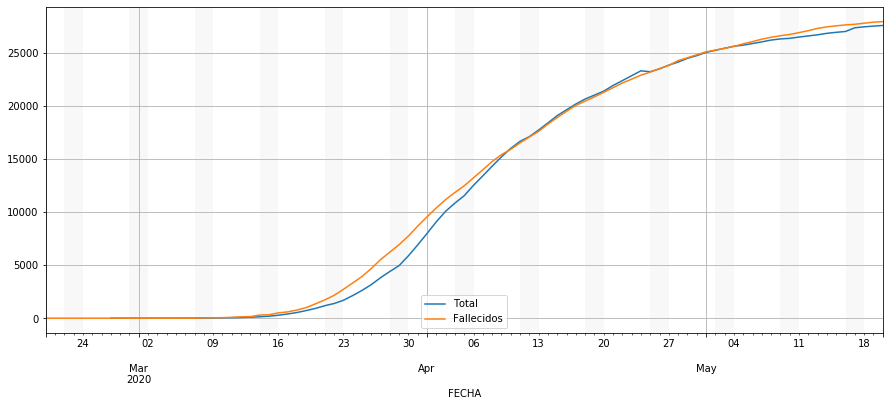

In [8]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)-1):
        if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(kv.index)

def highlight_datetimes(indices, ax,items=True):
    i = 0
    while i < len(indices):
        ax.axvspan(kv.index[indices[i]], kv.index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=dt.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=dt.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=dt.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=dt.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=dt.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=dt.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=dt.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=dt.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=dt.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')

        

fig, ax = plt.subplots(figsize=(15,6))
(kv[['Total']].shift(7)*.12).plot(ax=ax)
(kv[['Fallecidos']]).plot(ax=ax)
highlight_datetimes(weekend_indices, ax,items=False)
plt.legend()
plt.grid()

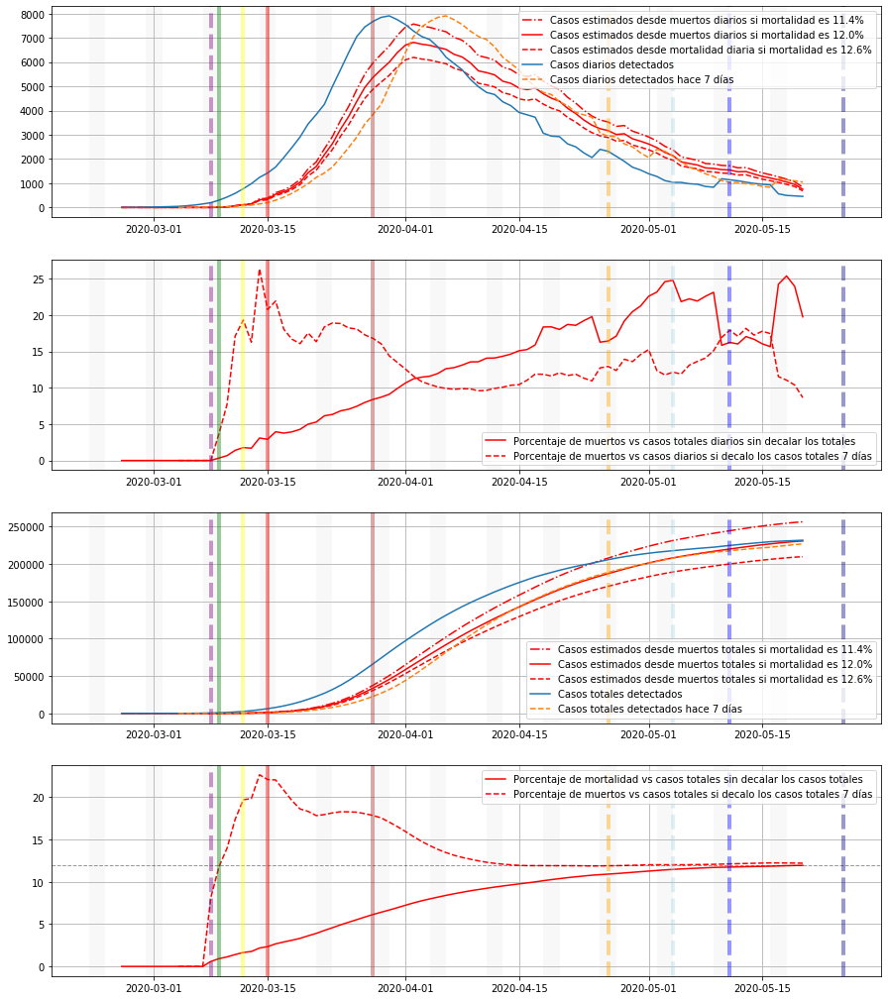

In [9]:
diasRetraso = 7
porcenMorta = 12

fig, ax = plt.subplots(4,figsize=(15,18))
ax[0].plot(kv.index,
        (kv[['DFallecidos']].rolling(7).mean()/(porcenMorta*.9/100.)),'-.',
         label='Casos estimados desde muertos diarios si mortalidad es {:.1f}%'.format(porcenMorta*.95),color='r')
ax[0].plot(kv.index,
        (kv[['DFallecidos']].rolling(7).mean()/(porcenMorta/100.)),
         label='Casos estimados desde muertos diarios si mortalidad es {:.1f}%'.format(porcenMorta),color='r')
ax[0].plot(kv.index,
        (kv[['DFallecidos']].rolling(7).mean()/(porcenMorta*1.1/100.)),'--',
         label='Casos estimados desde mortalidad diaria si mortalidad es {:.1f}%'.format(porcenMorta*1.05),color='r')
ax[0].plot(kv.index,kv[['DTotal']].rolling(7).mean(),label='Casos diarios detectados')
ax[0].plot(kv.index,kv[['DTotal']].rolling(7).mean().shift(diasRetraso),'--',
        label='Casos diarios detectados hace {} días'.format(diasRetraso))
#(kv[['DTotal']].rolling(7).mean()).plot(ax=ax)
#(kv[['DTotal']].rolling(7).mean().shift(7)).plot(ax=ax)
ax[0].legend()
ax[0].grid()
highlight_datetimes(weekend_indices, ax[0])


ax[1].plot(kv.index,
           (kv['DFallecidos'].rolling(7).mean()/kv['DTotal'].rolling(7).mean()*100.),
           color='r',
           label='Porcentaje de muertos vs casos totales diarios sin decalar los totales'.format(diasRetraso),
          )
ax[1].plot(kv.index,
           (kv['DFallecidos'].rolling(7).mean()/(kv['DTotal'].rolling(7).mean().shift(diasRetraso))*100.),
           '--',color='r',
           label='Porcentaje de muertos vs casos diarios si decalo los casos totales {} días'.format(diasRetraso),
          )
ax[1].grid()
ax[1].legend()
highlight_datetimes(weekend_indices, ax[1])

ax[2].plot(kv.index,
        (kv[['Fallecidos']].rolling(7).mean()/(porcenMorta*.9/100.)),'-.',
         label='Casos estimados desde muertos totales si mortalidad es {:.1f}%'.format(porcenMorta*.95),color='r')
ax[2].plot(kv.index,
        (kv[['Fallecidos']].rolling(7).mean()/(porcenMorta/100.)),
         label='Casos estimados desde muertos totales si mortalidad es {:.1f}%'.format(porcenMorta),color='r')
ax[2].plot(kv.index,
        (kv[['Fallecidos']].rolling(7).mean()/(porcenMorta*1.1/100.)),'--',
         label='Casos estimados desde muertos totales si mortalidad es {:.1f}%'.format(porcenMorta*1.05),color='r')
ax[2].plot(kv.index,kv[['Total']].rolling(7).mean(),label='Casos totales detectados')
ax[2].plot(kv.index,kv[['Total']].rolling(7).mean().shift(diasRetraso),'--',
        label='Casos totales detectados hace {} días'.format(diasRetraso))
ax[2].grid()
ax[2].legend()
highlight_datetimes(weekend_indices, ax[2])

ax[3].plot(kv.index,
           (kv['Fallecidos'].rolling(7).mean()/kv['Total'].rolling(7).mean()*100.),
           color='r',
           label='Porcentaje de mortalidad vs casos totales sin decalar los casos totales'.format(diasRetraso),
          )
ax[3].plot(kv.index,
           (kv['Fallecidos'].rolling(7).mean()/(kv['Total'].rolling(7).mean().shift(diasRetraso))*100.),
           '--',color='r',
           label='Porcentaje de muertos vs casos totales si decalo los casos totales {} días'.format(diasRetraso),
          )
ax[3].axhline(y=12,ls='--',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')
        
ax[3].grid()
ax[3].legend()
highlight_datetimes(weekend_indices, ax[3])

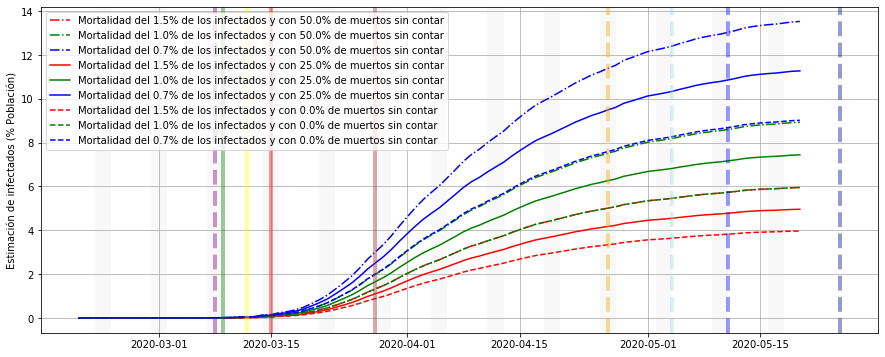

In [10]:
#poblacion = 46400000
porcenErrorMuertos = 25.#100*5000/23000#25. 

fig, ax = plt.subplots(figsize=(15,6))
for porcenErrorMuertos,l in zip([50.,25.,0.],['-.','-','--']):
    for i,c in zip([1.5,1,.66],['r','g','b']):
        ax.plot(kv.index,kv[['Fallecidos']].values*(100.+porcenErrorMuertos)*(100./i)/poblacion.Value.sum(),
                l,
                color=c,
                label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,porcenErrorMuertos))
    #ax.plot(kv.index,kv[['Fallecidos']].values*(100)*(100./i)/poblacion.Value.sum(),'--',
    #        color=c,
    #        label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,0))
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.03/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.01/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.006/poblacion.Value.sum()).plot(ax=ax)
ax.set_ylabel('Estimación de infectados (% Población)')
plt.grid()
plt.legend()
#ax.set_title('Mortalidad (+ Subestimación mortalidad de {:.2f}) = ')
highlight_datetimes(weekend_indices, ax)

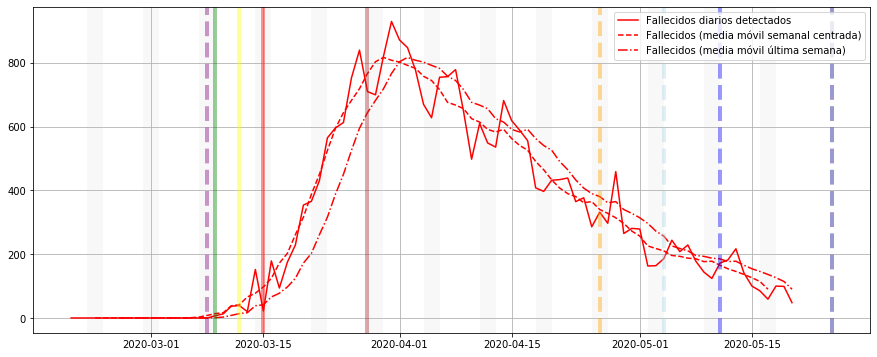

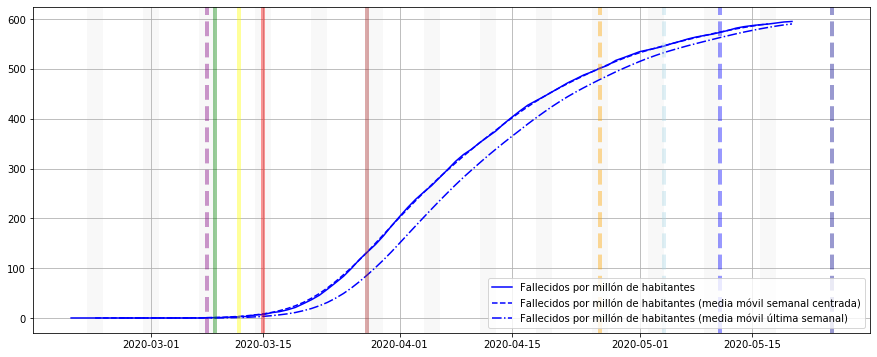

In [11]:
fig, ax = plt.subplots(figsize=(15,6))
ax.plot(kv.index,kv[['DFallecidos']],color='r',label='Fallecidos diarios detectados')
ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=True).mean(),'--',color='r',
        label='Fallecidos (media móvil semanal centrada)')
ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean(),'-.',color='r',
        label='Fallecidos (media móvil última semana)')
plt.grid()
plt.legend()
highlight_datetimes(weekend_indices, ax)
plt.show()

fig, ax = plt.subplots(figsize=(15,6))
ax.plot(kv.index,kv[['Fallecidos']]/poblacion.Value.sum()*1000000,color='b',label='Fallecidos por millón de habitantes')
ax.plot(kv.index,kv[['Fallecidos']].rolling(7,center=True).mean()/poblacion.Value.sum()*1000000,'--',color='b',
        label='Fallecidos por millón de habitantes (media móvil semanal centrada)')
ax.plot(kv.index,kv[['Fallecidos']].rolling(7,center=False).mean()/poblacion.Value.sum()*1000000,'-.',color='b',
        label='Fallecidos por millón de habitantes (media móvil última semanal)')
plt.grid()
plt.legend()
highlight_datetimes(weekend_indices, ax)
plt.show()

In [12]:
12/7.5

1.6

8.0


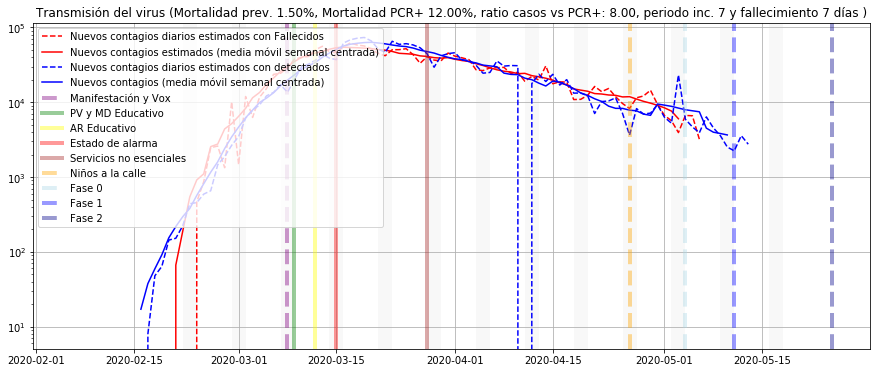

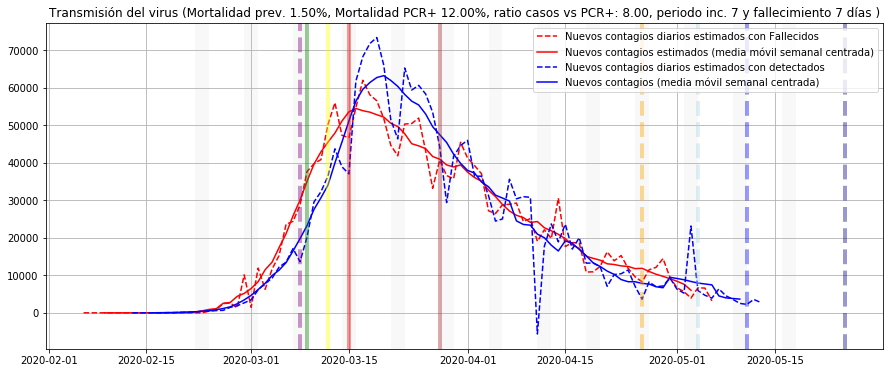

In [13]:
diasIncubacion = 7
diasRetraso = 7
mortalidadVsDetecciones = 12./100.
mortalidad = 1.5/100.
ratioCasosDetecciones = mortalidadVsDetecciones / mortalidad
print(ratioCasosDetecciones)
fig, ax = plt.subplots(figsize=(15,6))
plt.title('Transmisión del virus (Mortalidad prev. {:.2f}%, Mortalidad PCR+ {:.2f}%, ratio casos vs PCR+: {:.2f}, periodo inc. {} y fallecimiento {} días )'.format(
    100*mortalidad,100*mortalidadVsDetecciones,ratioCasosDetecciones,diasIncubacion,diasRetraso
))
ax.plot(kv.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),kv[['DFallecidos']]/mortalidad,'--',color='r',label='Nuevos contagios diarios estimados con Fallecidos')
ax.plot(kv.index-pd.DateOffset(days=diasRetraso+diasIncubacion),kv[['DFallecidos']].rolling(7,center=True).mean()/mortalidad,'-',color='r',
        label='Nuevos contagios estimados (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean().shift(-1*diasRetraso)/.12,'-.',color='r',
#        label='Fallecidos (media móvil última semana)')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']]*ratioCasosDetecciones,'--',color='b',label='Nuevos contagios diarios estimados con detectados')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']].rolling(7,center=True).mean()*ratioCasosDetecciones,'-',color='b',
        label='Nuevos contagios (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DTotal']].rolling(7,center=False).mean(),'-.',color='b',
#        label='Nuevos casos  (media móvil última semana)')

highlight_datetimes(weekend_indices, ax)


plt.grid()
plt.legend(loc='upper left')

plt.yscale('log')
plt.show()

fig, ax = plt.subplots(figsize=(15,6))
plt.title('Transmisión del virus (Mortalidad prev. {:.2f}%, Mortalidad PCR+ {:.2f}%, ratio casos vs PCR+: {:.2f}, periodo inc. {} y fallecimiento {} días )'.format(
    100*mortalidad,100*mortalidadVsDetecciones,ratioCasosDetecciones,diasIncubacion,diasRetraso
))
ax.plot(kv.index-pd.DateOffset(days=(diasRetraso+diasIncubacion)),kv[['DFallecidos']]/mortalidad,'--',color='r',label='Nuevos contagios diarios estimados con Fallecidos')
ax.plot(kv.index-pd.DateOffset(days=diasRetraso+diasIncubacion),kv[['DFallecidos']].rolling(7,center=True).mean()/mortalidad,'-',color='r',
        label='Nuevos contagios estimados (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DFallecidos']].rolling(7,center=False).mean().shift(-1*diasRetraso)/.12,'-.',color='r',
#        label='Fallecidos (media móvil última semana)')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']]*ratioCasosDetecciones,'--',color='b',label='Nuevos contagios diarios estimados con detectados')
ax.plot(kv.index-pd.DateOffset(days=diasIncubacion),kv[['DTotal']].rolling(7,center=True).mean()*ratioCasosDetecciones,'-',color='b',
        label='Nuevos contagios (media móvil semanal centrada)')
#ax.plot(kv.index,kv[['DTotal']].rolling(7,center=False).mean(),'-.',color='b',
#        label='Nuevos casos  (media móvil última semana)')



plt.grid()
plt.legend()
highlight_datetimes(weekend_indices, ax)


plt.show()

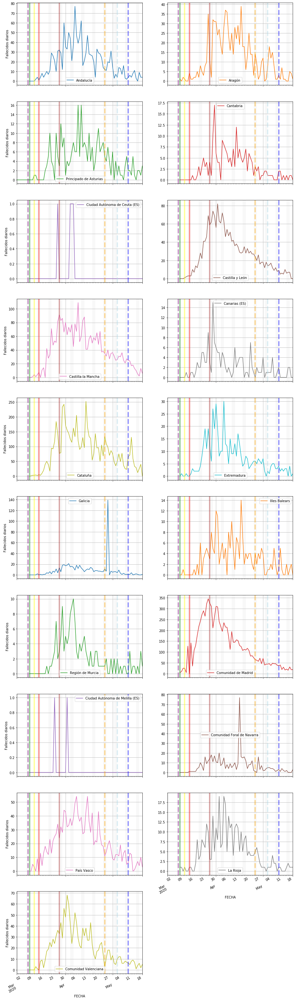

In [14]:


axes = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).plot(subplots=True, 
                                                                grid=True,
                                                                figsize=(15, 60),
                                                                layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        highlight_datetimes(weekend_indices, kaxi[0])
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos diarios')
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        highlight_datetimes(weekend_indices, kaxi[1])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue

plt.show()

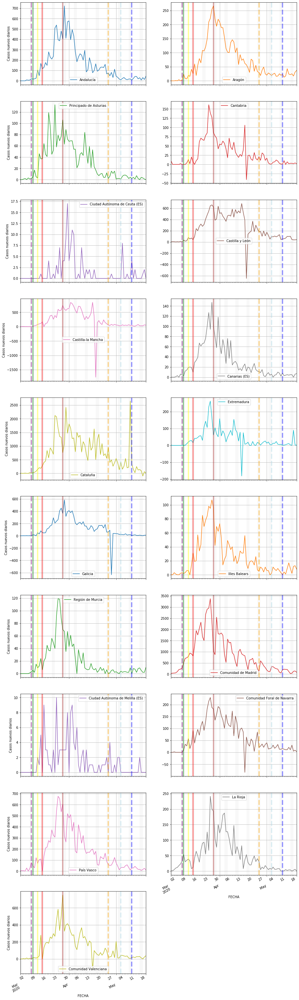

In [15]:
axes = datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).plot(subplots=True,
                                                                    grid=True, 
                                                                    figsize=(15, 60), 
                                                                    layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Casos nuevos diarios')
        highlight_datetimes(weekend_indices, kaxi[0])
        highlight_datetimes(weekend_indices, kaxi[1])
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue
#plt.title('Casos nuevos diarios')
plt.show()


In [16]:
owid_covid = pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv',
                        
            index_col=[1,2],
            parse_dates=[2],
            infer_datetime_format=True,)
owid_covid.columns

Index(['iso_code', 'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
       'total_cases_per_million', 'new_cases_per_million',
       'total_deaths_per_million', 'new_deaths_per_million', 'total_tests',
       'new_tests', 'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_100k'],
      dtype='object')

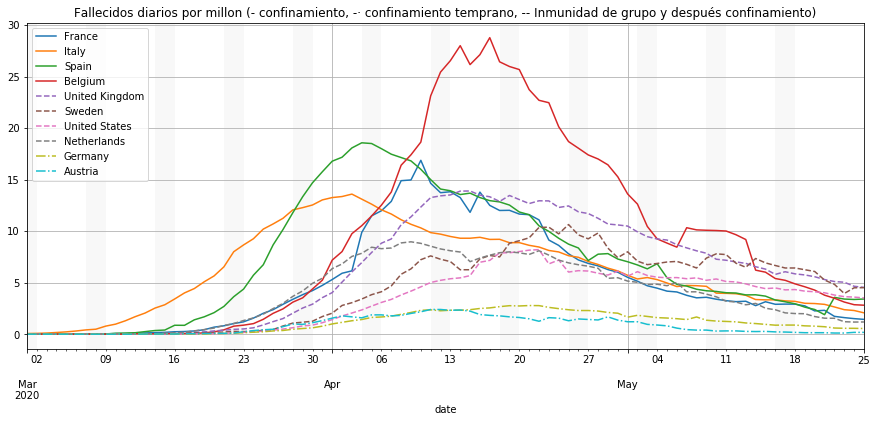

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-04-21,8.380,7.509,9.197,12.511,8.234,3.961,5.610,3.910,2.315,1.110
2020-04-22,8.135,8.832,9.304,14.668,17.264,18.318,7.625,9.629,3.354,0.111
2020-04-23,8.334,7.228,9.411,22.779,12.329,17.031,5.199,8.054,2.566,3.442
2020-04-24,7.905,7.674,7.849,19.673,10.709,8.317,9.604,7.178,2.709,1.554
2020-04-25,5.960,6.947,8.085,16.308,14.804,12.971,3.184,6.536,2.136,0.555
2020-04-26,5.653,6.864,6.160,20.536,12.418,3.961,6.562,7.003,1.671,2.554
2020-04-27,3.707,4.300,0.000,15.272,6.187,0.198,5.097,3.852,1.313,0.666
2020-04-28,6.695,5.508,13.517,9.750,4.979,7.921,4.136,2.510,1.945,0.777
2020-04-29,5.622,6.318,9.689,10.699,13.390,8.020,6.375,2.801,2.411,2.221


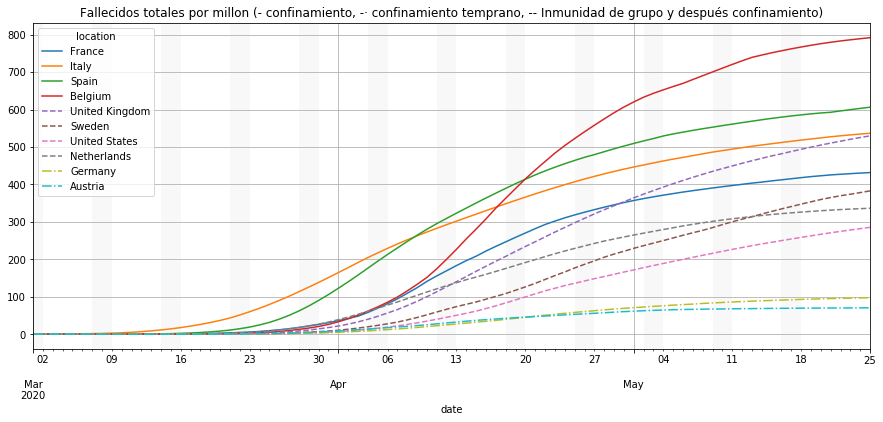

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-04-21,310.463,398.830,455.183,502.864,280.632,156.447,128.516,218.910,54.879,51.297
2020-04-22,318.598,407.662,464.487,517.532,297.896,174.765,136.141,228.540,58.233,51.408
2020-04-23,326.932,414.890,473.898,540.311,310.226,191.796,141.340,236.594,60.799,54.850
2020-04-24,334.837,422.564,481.748,559.984,320.935,200.113,150.944,243.772,63.509,56.404
2020-04-25,340.797,429.511,489.832,576.292,335.739,213.085,154.129,250.308,65.645,56.959
2020-04-26,346.450,436.375,495.992,596.827,348.157,217.045,160.691,257.312,67.316,59.513
2020-04-27,350.157,440.675,495.992,612.100,354.344,217.243,165.787,261.163,68.629,60.179
2020-04-28,356.852,446.182,509.509,621.850,359.323,225.165,169.923,263.673,70.574,60.957
2020-04-29,362.475,452.500,519.198,632.549,372.713,233.185,176.298,266.474,72.985,63.177


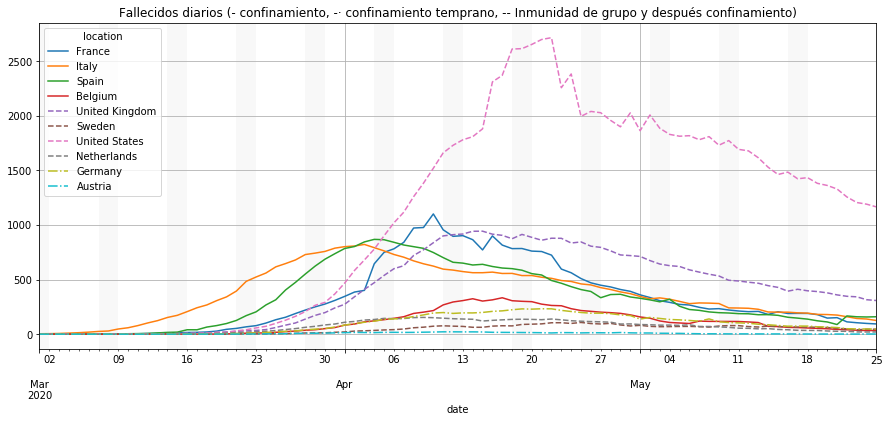

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-04-21,547.0,454.0,430.0,145.0,559.0,40.0,1857.0,67.0,194.0,10.0
2020-04-22,531.0,534.0,435.0,170.0,1172.0,185.0,2524.0,165.0,281.0,1.0
2020-04-23,544.0,437.0,440.0,264.0,837.0,172.0,1721.0,138.0,215.0,31.0
2020-04-24,516.0,464.0,367.0,228.0,727.0,84.0,3179.0,123.0,227.0,14.0
2020-04-25,389.0,420.0,378.0,189.0,1005.0,131.0,1054.0,112.0,179.0,5.0
2020-04-26,369.0,415.0,288.0,238.0,843.0,40.0,2172.0,120.0,140.0,23.0
2020-04-27,242.0,260.0,0.0,177.0,420.0,2.0,1687.0,66.0,110.0,6.0
2020-04-28,437.0,333.0,632.0,113.0,338.0,80.0,1369.0,43.0,163.0,7.0
2020-04-29,367.0,382.0,453.0,124.0,909.0,81.0,2110.0,48.0,202.0,20.0


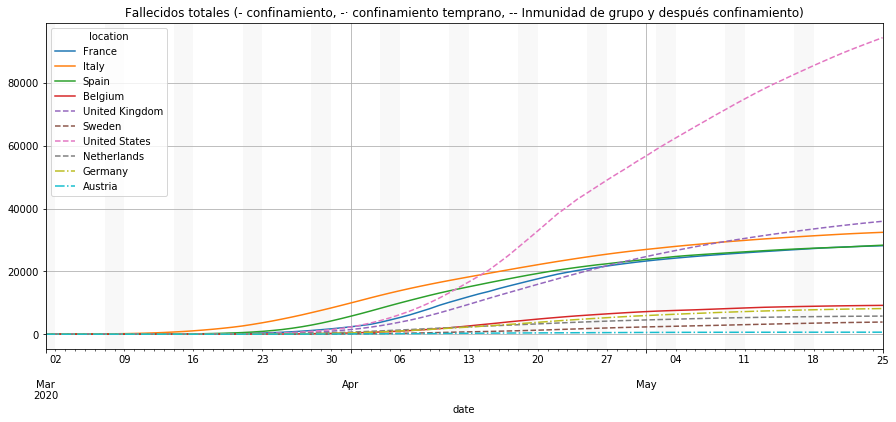

location,France,Italy,Spain,Belgium,United Kingdom,Sweden,United States,Netherlands,Germany,Austria
date,,,,,,,,,,
2020-04-21,20265.0,24114.0,21282.0,5828.0,19051.0,1580.0,42539.0,3751.0,4598.0,462.0
2020-04-22,20796.0,24648.0,21717.0,5998.0,20223.0,1765.0,45063.0,3916.0,4879.0,463.0
2020-04-23,21340.0,25085.0,22157.0,6262.0,21060.0,1937.0,46784.0,4054.0,5094.0,494.0
2020-04-24,21856.0,25549.0,22524.0,6490.0,21787.0,2021.0,49963.0,4177.0,5321.0,508.0
2020-04-25,22245.0,25969.0,22902.0,6679.0,22792.0,2152.0,51017.0,4289.0,5500.0,513.0
2020-04-26,22614.0,26384.0,23190.0,6917.0,23635.0,2192.0,53189.0,4409.0,5640.0,536.0
2020-04-27,22856.0,26644.0,23190.0,7094.0,24055.0,2194.0,54876.0,4475.0,5750.0,542.0
2020-04-28,23293.0,26977.0,23822.0,7207.0,24393.0,2274.0,56245.0,4518.0,5913.0,549.0
2020-04-29,23660.0,27359.0,24275.0,7331.0,25302.0,2355.0,58355.0,4566.0,6115.0,569.0


In [17]:
lpaises = ['France','Italy','Spain','Belgium',
           'United Kingdom','Sweden','United States','Netherlands',
           'Germany','Austria']
           #'New Zealand','Australia']
llines  = ['-','-','-','-',
           '--','--','--','--',
           '-.','-.']



fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Fallecidos diarios por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['new_deaths_per_million']].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                               grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-04-21':],lpaises])


fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos totales por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises,:],
               'total_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['total_deaths_per_million']].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                                 grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises],
               'total_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-04-21':],lpaises])

fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos diarios (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises],
               'new_deaths'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['new_deaths']].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                                 grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises],
               'new_deaths'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-04-21':],lpaises])


fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos totales (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises,:],
               'total_deaths'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()
#owid_covid.loc[lpaises,
#               ['total_deaths_per_million']].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
#                                                                                                 grid=True,
#                                                                                  figsize=(15, 60), 
#                                                                                  layout=(10, 2));

display(owid_covid.loc[idx[lpaises],
               'total_deaths'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-04-21':],lpaises])




In [18]:
owid_covid[owid_covid.iso_code == 'ESP'].unstack(level=0).rolling(7,center=True).apply(np.nanmean).loc[idx['2020-04-01':],'total_deaths_per_million']
owid_covid.loc[idx[lpaises],
               'new_deaths_per_million'].unstack(level=0).loc[idx['2020-04-01':]]
#for i in owid_covid.index.levels[0]:
#    print (i,owid_covid.loc[idx[i,:],'iso_code'].head(1).values[0])

location,Austria,Belgium,Germany,Spain,France,United Kingdom,Italy,Netherlands,Sweden,United States
date,,,,,,,,,,
2020-04-01,2.221,16.567,1.778,18.159,7.645,5.627,13.877,10.213,3.367,2.746
2020-04-02,1.999,10.613,1.671,18.479,7.798,9.869,12.024,7.820,5.842,3.199
2020-04-03,1.332,15.790,1.731,20.319,7.216,9.604,12.570,9.688,4.258,2.764
2020-04-04,1.110,11.390,1.683,19.934,30.702,10.518,12.636,8.637,5.050,3.335
2020-04-05,1.999,12.080,2.196,17.303,16.132,11.195,11.263,9.571,3.961,4.060
2020-04-06,1.999,14.151,1.098,14.416,7.936,9.486,8.716,6.711,2.772,3.462
2020-04-07,1.777,15.963,2.065,13.624,12.762,8.367,10.519,5.894,7.525,4.054
2020-04-08,2.554,34.773,3.032,15.891,21.709,15.290,9.990,13.656,11.288,5.758
2020-04-09,3.331,17.688,2.936,16.191,8.288,15.231,8.931,8.579,9.506,5.807


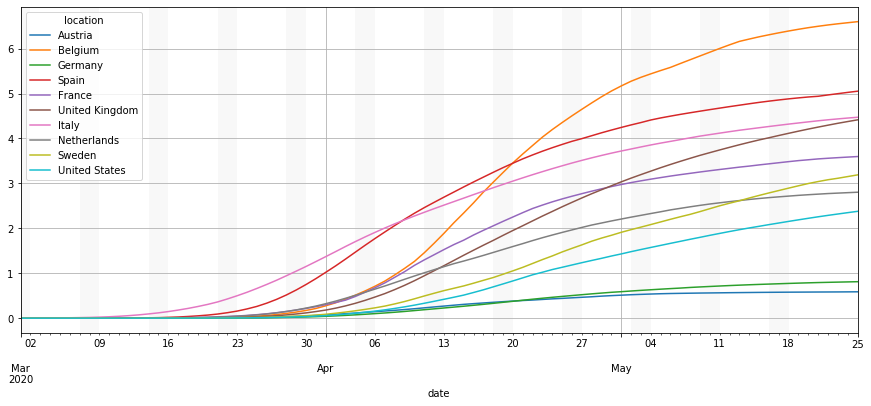

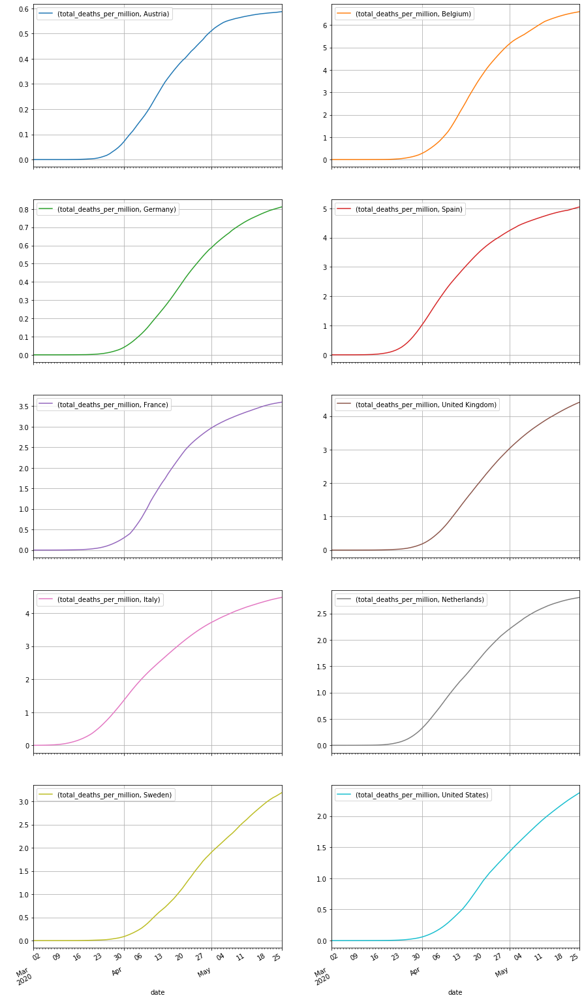

In [19]:
mortalidad = 1.5
porcenErrorMuertos = 25.#100*5000/23000#25. 



fig, ax = plt.subplots(figsize=(15,6))

(owid_covid.loc[lpaises,
               'total_deaths_per_million']*(100./mortalidad)/1000000*(100+porcenErrorMuertos)).unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(linestyle='-',ax=ax)
#(owid_covid.loc[lpaises,
#               'total_deaths_per_million']*(100./1.)/1000000*(100+porcenErrorMuertos)).unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(linestyle='--',ax=ax)
plt.grid()

highlight_datetimes(weekend_indices, ax,items=False)
plt.show()
(owid_covid.loc[lpaises,
               ['total_deaths_per_million']]*(100./mortalidad)/1000000*(100+porcenErrorMuertos)).unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':]].plot(subplots=True,
                                                                                                                                 grid=True,
                                                                                  figsize=(15, 60), 
                                                                                  layout=(10, 2));




In [20]:
owid_spain = owid_covid.loc['Spain',:].loc['2020-03':]
#owid_spain 

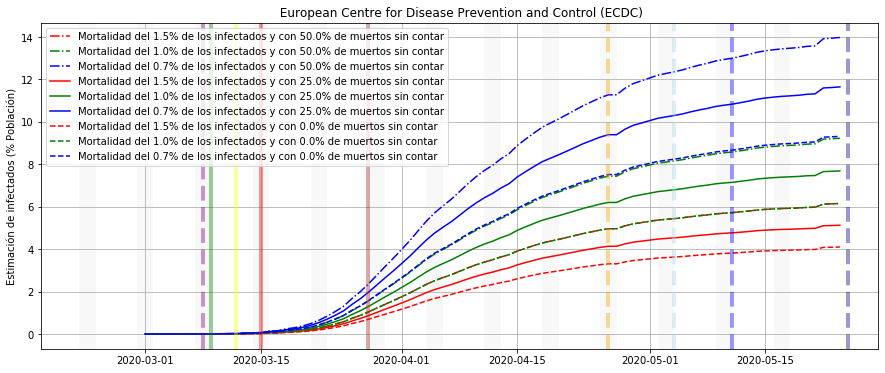

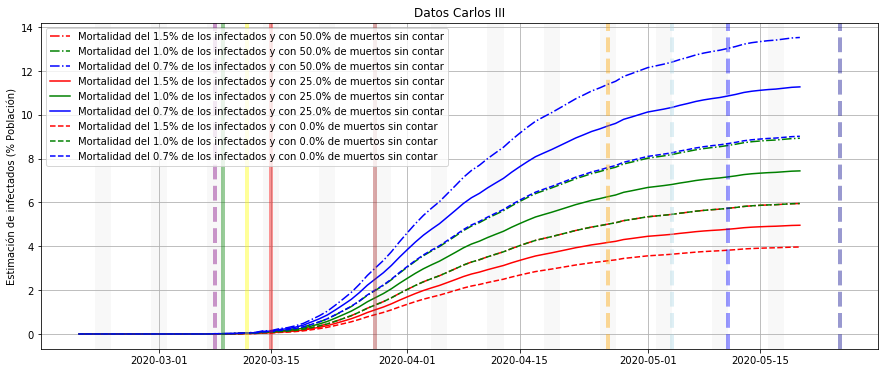

In [21]:

porcenErrorMuertos = 25.#100*5000/23000#25. 

fig, ax = plt.subplots(figsize=(15,6))
for porcenErrorMuertos,l in zip([50.,25.,0.],['-.','-','--']):
    for i,c in zip([1.5,1,.66],['r','g','b']):
        ax.plot(owid_spain.index,owid_spain.total_deaths_per_million*(100.+porcenErrorMuertos)*(100./i)/1000000.,
                l,
                color=c,
                label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,porcenErrorMuertos))
    #ax.plot(kv.index,kv[['Fallecidos']].values*(100)*(100./i)/poblacion.Value.sum(),'--',
    #        color=c,
    #        label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,0))
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.03/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.01/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.006/poblacion.Value.sum()).plot(ax=ax)
ax.set_ylabel('Estimación de infectados (% Población)')
plt.grid()
plt.legend()
plt.title(' European Centre for Disease Prevention and Control (ECDC)')
#ax.set_title('Mortalidad (+ Subestimación mortalidad de {:.2f}) = ')
highlight_datetimes(weekend_indices, ax)
plt.show()
#ax.set_title(' European Centre for Disease Prevention and Control (ECDC)')
#poblacion = 46400000
porcenErrorMuertos = 25.#100*5000/23000#25. 

fig, ax = plt.subplots(figsize=(15,6))
for porcenErrorMuertos,l in zip([50.,25.,0.],['-.','-','--']):
    for i,c in zip([1.5,1,.66],['r','g','b']):
        ax.plot(kv.index,kv[['Fallecidos']].values*(100.+porcenErrorMuertos)*(100./i)/poblacion.Value.sum(),
                l,
                color=c,
                label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,porcenErrorMuertos))
    #ax.plot(kv.index,kv[['Fallecidos']].values*(100)*(100./i)/poblacion.Value.sum(),'--',
    #        color=c,
    #        label=u'Mortalidad del {:.1f}% de los infectados y con {:.1f}% de muertos sin contar'.format(i,0))
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.03/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.01/poblacion.Value.sum()).plot(ax=ax)
#(kv[['Fallecidos']]*(100.+porcenErrorMuertos)/.006/poblacion.Value.sum()).plot(ax=ax)
ax.set_ylabel('Estimación de infectados (% Población)')
plt.grid()
plt.legend()
plt.title('Datos Carlos III')
#ax.set_title('Mortalidad (+ Subestimación mortalidad de {:.2f}) = ')
highlight_datetimes(weekend_indices, ax)
plt.show()

In [22]:
#poblacion = pd.read_csv('demo_r_d2jan_1_Data.csv',sep=';',index_col=['Flag and Footnotes'])
display(poblacion.tail())
poblacion.Value.sum()

,TIME,GEO,SEX,AGE,UNIT,Value
Flag and Footnotes,,,,,,
AN,2019,Andalucía,Total,Total,Number,8427405
MC,2019,Región de Murcia,Total,Total,Number,1487663
CE,2019,Ciudad Autónoma de Ceuta (ES),Total,Total,Number,84829
ML,2019,Ciudad Autónoma de Melilla (ES),Total,Total,Number,84689
CN,2019,Canarias (ES),Total,Total,Number,2206901


46937060

In [23]:
fallecidos = datos.loc[idx['2020-03-01':]].Fallecidos.unstack(level=1)
fallecidos.tail()

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-05-16,1358.0,838.0,299.0,207.0,4.0,1946.0,2893.0,151.0,5944.0,500.0,606.0,218.0,144.0,8847.0,2.0,503.0,1459.0,349.0,1366.0
2020-05-17,1358.0,838.0,301.0,207.0,4.0,1953.0,2898.0,153.0,5956.0,500.0,607.0,218.0,145.0,8863.0,2.0,503.0,1466.0,351.0,1370.0
2020-05-18,1367.0,843.0,303.0,208.0,4.0,1960.0,2900.0,155.0,5981.0,504.0,607.0,219.0,145.0,8894.0,2.0,503.0,1470.0,352.0,1376.0
2020-05-19,1371.0,847.0,304.0,209.0,4.0,1960.0,2913.0,155.0,6021.0,504.0,607.0,221.0,148.0,8912.0,2.0,503.0,1480.0,353.0,1378.0
2020-05-20,1375.0,848.0,307.0,209.0,4.0,1960.0,2919.0,155.0,6021.0,505.0,608.0,221.0,149.0,8931.0,2.0,506.0,1483.0,354.0,1383.0


In [24]:
poblacion.loc[fallecidos.columns,['Value']].T

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
Value,8427405,1320586,1022205,581641,84829,2407733,2034877,2206901,7566431,1065424,2700441,1188220,1487663,6641649,84689,649946,2177880,313571,4974969


In [25]:
(100*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).tail(1)

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-05-20,0.016316,0.064214,0.030033,0.035933,0.004715,0.081404,0.143448,0.007023,0.079575,0.047399,0.022515,0.018599,0.010016,0.13447,0.002362,0.077853,0.068094,0.112893,0.027799


Informe preeliminar de prevalencia
--------------

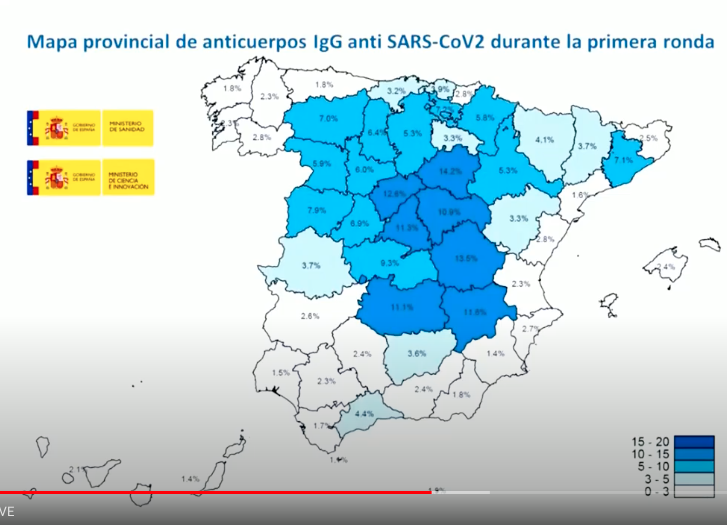

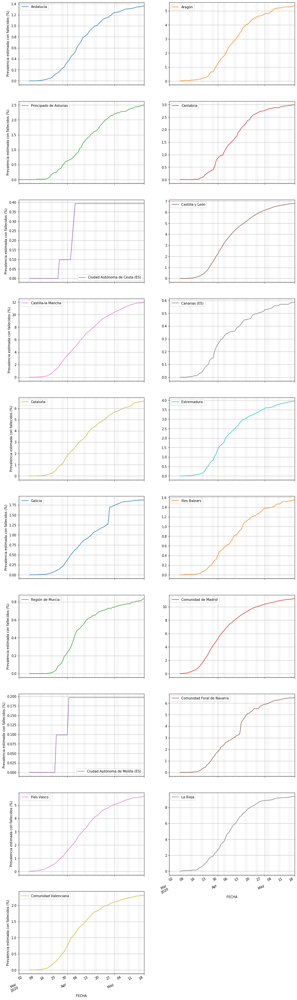

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-05-16,1.342841,5.288056,2.437541,2.965747,0.392947,6.735243,11.847563,0.570181,6.546459,3.910806,1.870065,1.528898,0.806634,11.100406,0.196798,6.449254,5.582646,9.274880,2.288121
2020-05-17,1.342841,5.288056,2.453846,2.965747,0.392947,6.759470,11.868039,0.577733,6.559676,3.910806,1.873151,1.528898,0.812236,11.120481,0.196798,6.449254,5.609431,9.328031,2.294822
2020-05-18,1.351741,5.319608,2.470150,2.980074,0.392947,6.783698,11.876230,0.585285,6.587210,3.942093,1.873151,1.535911,0.812236,11.159377,0.196798,6.449254,5.624736,9.354607,2.304872
2020-05-19,1.355696,5.344849,2.478303,2.994401,0.392947,6.783698,11.929468,0.585285,6.631264,3.942093,1.873151,1.549937,0.829041,11.181962,0.196798,6.449254,5.662999,9.381182,2.308222
2020-05-20,1.359651,5.351160,2.502760,2.994401,0.392947,6.783698,11.954039,0.585285,6.631264,3.949914,1.876237,1.549937,0.834642,11.205801,0.196798,6.487718,5.674479,9.407758,2.316597


In [26]:
porcenErrorMuertos=25
mortalidad = 1.5
axes = ((100.+porcenErrorMuertos)*(100./mortalidad)*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           #legend=poblacion.loc[fallecidos.columns,'GEO'].values,                                                                                                    
           layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Prevalencia estimada con fallecidos (%)')
        highlight_datetimes(weekend_indices, kaxi[0],items=False)
        highlight_datetimes(weekend_indices, kaxi[1],items=False)
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue
        
plt.show()

(100.+porcenErrorMuertos)*(100./mortalidad)*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1).tail()


Comparación de las CCAAs con otros pasies 
-----------------------------------------

Cantidades normalizadas por la población

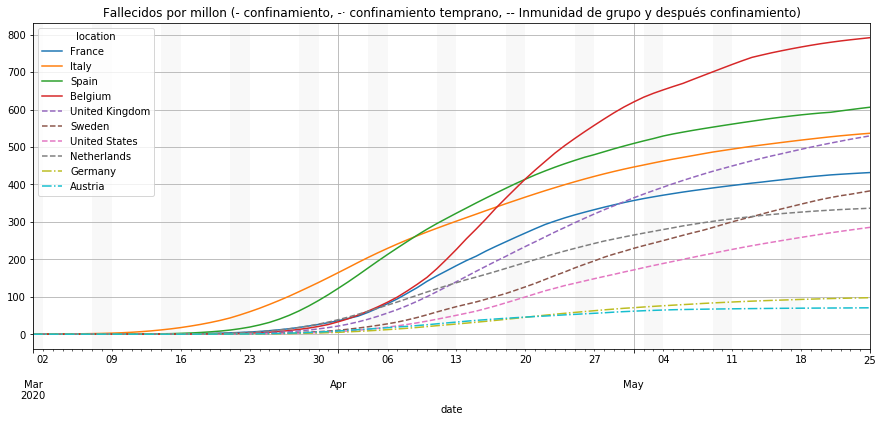

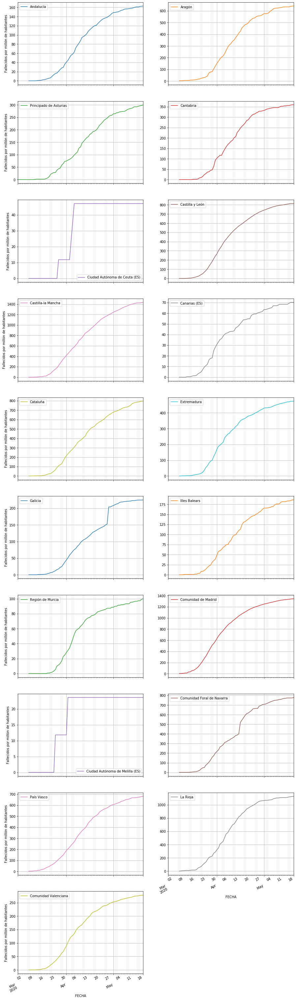

In [27]:
fig, ax = plt.subplots(figsize=(15,6))
plt.title('Fallecidos por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
owid_covid.loc[idx[lpaises,:],
               'total_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
plt.grid()
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()

axes = (1000000*fallecidos.divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        highlight_datetimes(weekend_indices, kaxi[0],items=False)
        kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos por millón de habitantes')
        highlight_datetimes(weekend_indices, kaxi[1],items=False)
        #print(kaxi[1].legendlabels,poblacion.at[kaxi[1].legendlabels[0],'GEO'])
        kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
    except:
        continue

plt.show()

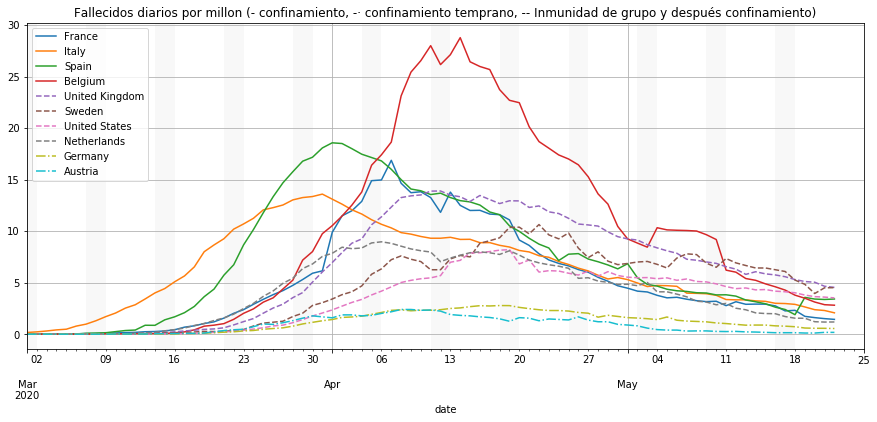

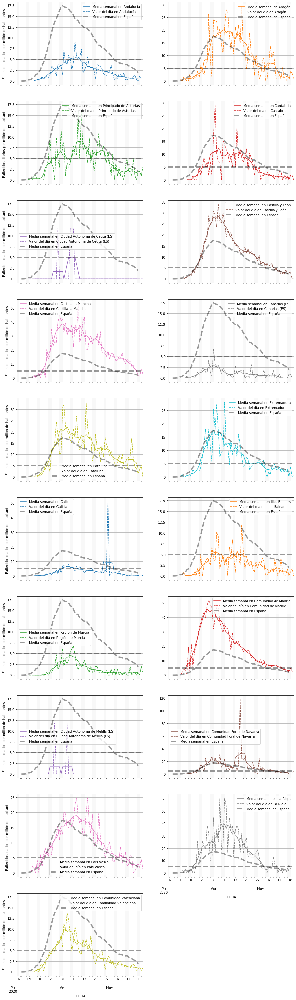

In [28]:


fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Fallecidos diarios por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()


ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()


axes = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').rolling(7,center=True).mean().divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
indices = datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).index
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        
        highlight_datetimes(weekend_indices, kaxi[0],items=False)
        #kaxi[0].legend( [poblacion.at[kaxi[0].legendlabels[0],'GEO']])
        kaxi[0].set(ylabel='Fallecidos diarios por millón de habitantes')
        ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kaxi[0].get_lines()[-1].get_color())
        ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[0].axhline(y=5,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        
        kaxi[0].grid()


        highlight_datetimes(weekend_indices, kaxi[1],items=False)
        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='--',c=kaxi[1].get_lines()[-1].get_color())
        ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[1],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[1].axhline(y=5,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        kaxi[1].grid()


    except:
        continue
#kcolor = kaxi[0].get_lines()[-1].get_color()
#ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kcolor)

plt.show()

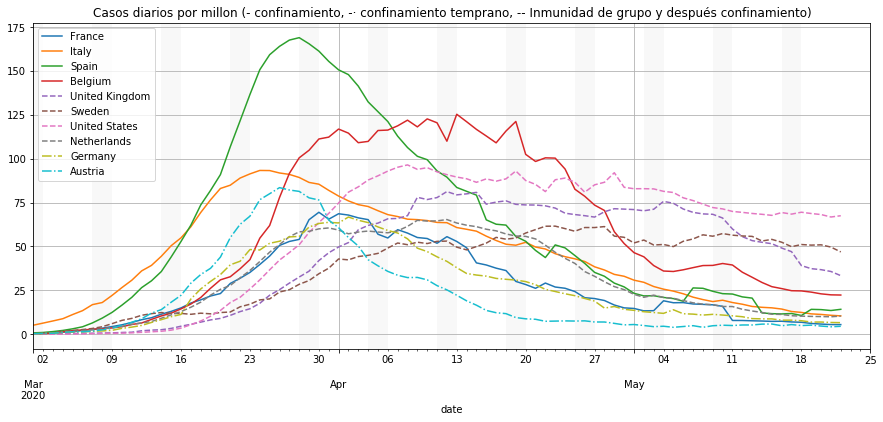

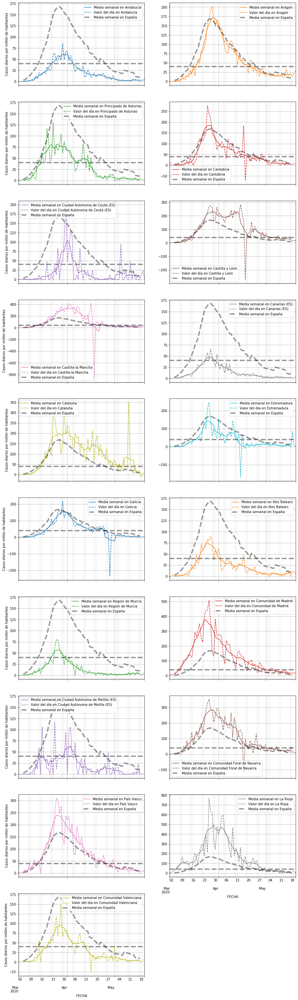

In [29]:

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'new_cases_per_million'].unstack(level=0).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Casos diarios por millon (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()


ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()

 
axes = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index').rolling(7,center=True).mean().divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)).plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
indices = datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).index
for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        
        highlight_datetimes(weekend_indices, kaxi[0],items=False)
        kaxi[0].set(ylabel='Casos diarios por millón de habitantes')
        ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kaxi[0].get_lines()[-1].get_color())
        ktabla[u'España'].rolling(7,center=True).mean().plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)
        
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[0].axhline(y=40,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        #owid_covid.loc[idx[lpaises,:],
        #       'new_cases_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],'Spain'].plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)


        kaxi[0].grid()


        highlight_datetimes(weekend_indices, kaxi[1],items=False)
        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='--',c=kaxi[1].get_lines()[-1].get_color())
        ktabla[[u'España']].rolling(7,center=True).mean().plot(ax=kaxi[1],ls='--',linewidth=4, color='k',alpha=.4)
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[1].axhline(y=40,ls='--',linewidth=4, color='k',alpha=.4)#,label='Manifestación y Vox')
        kaxi[1].grid()


    except:
        continue

plt.show()    


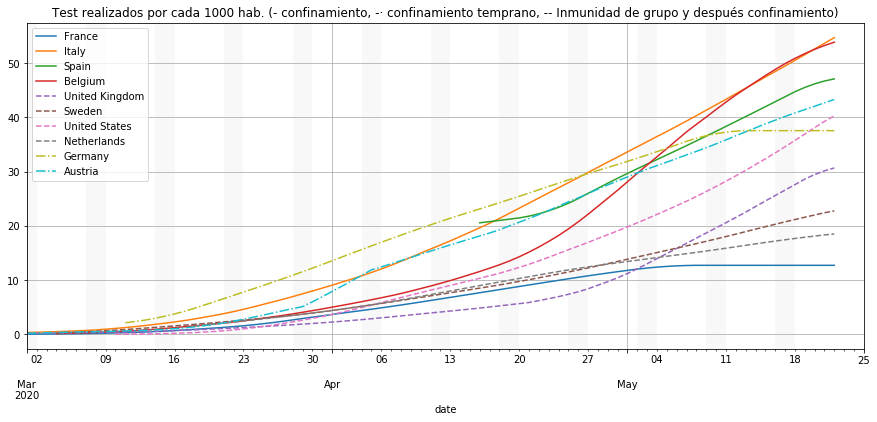

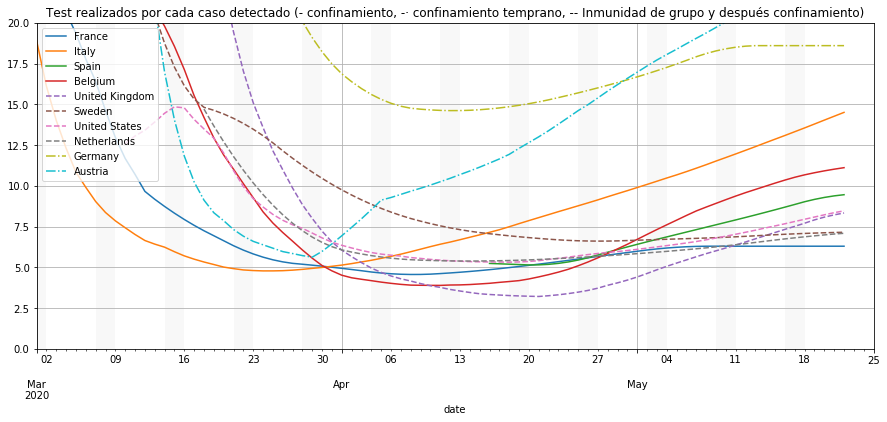

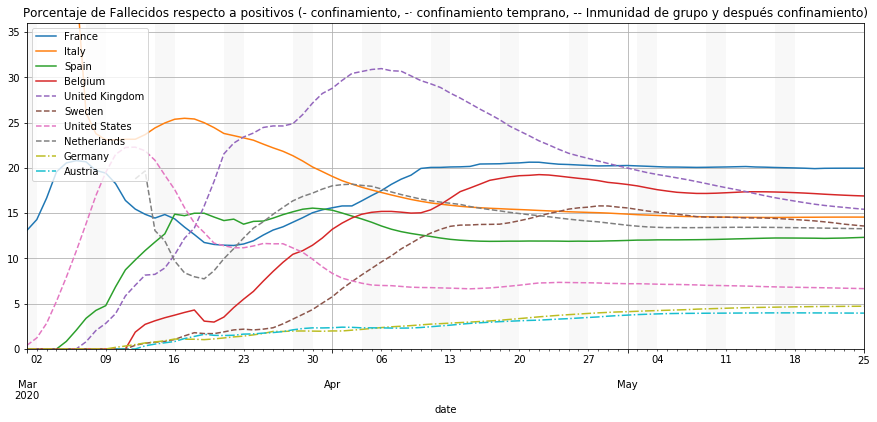

In [30]:

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'total_tests_per_thousand'].unstack(level=0).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.grid()
plt.legend(loc='upper left')
plt.title('Test realizados por cada 1000 hab. (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)
plt.show()

fig, ax = plt.subplots(figsize=(15,6))
owid_covid.loc[idx[lpaises,:],
               'total_tests'].unstack(level=0).divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].unstack(level=0)).interpolate('index').rolling(7,center=True).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Test realizados por cada caso detectado (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)

#plt.yscale('log')

plt.ylim(0,20)
plt.grid()
plt.show()

diasRetraso = 7
fig, ax = plt.subplots(figsize=(15,6))
(100*owid_covid.loc[idx[lpaises,:],
               'total_deaths'].unstack(level=0).divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].unstack(level=0).shift(diasRetraso)).interpolate('index').rolling(7,center=False).mean()).loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Porcentaje de Fallecidos respecto a positivos (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)

#plt.yscale('log')
plt.ylim(0,36)
plt.grid()
plt.show()

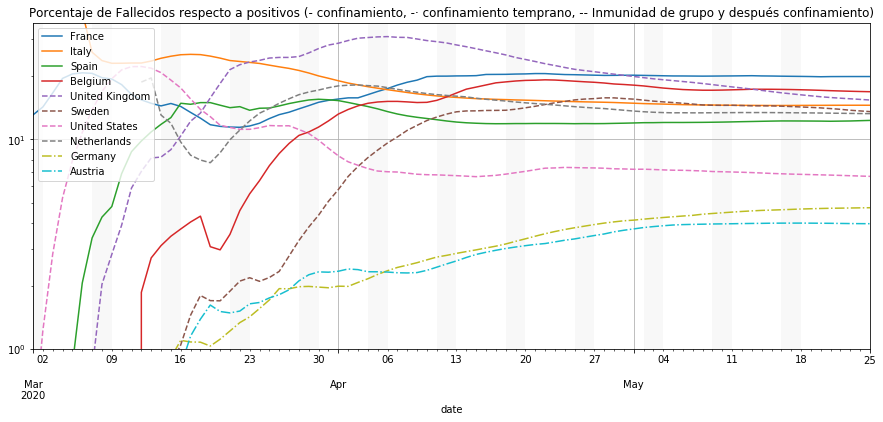

In [31]:
diasRetraso = 7
fig, ax = plt.subplots(figsize=(15,6))
(100*owid_covid.loc[idx[lpaises,:],
               'total_deaths'].unstack(level=0).divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].unstack(level=0).shift(diasRetraso)).interpolate('index').rolling(7,center=False).mean()).loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Porcentaje de Fallecidos respecto a positivos (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=False)

plt.yscale('log')
plt.ylim(1,36)
plt.grid()
plt.show()

In [32]:
owid_covid.columns

Index(['iso_code', 'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
       'total_cases_per_million', 'new_cases_per_million',
       'total_deaths_per_million', 'new_deaths_per_million', 'total_tests',
       'new_tests', 'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_100k'],
      dtype='object')

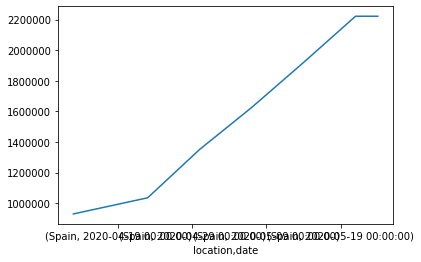

In [33]:
owid_covid.loc[idx['Spain',:],'total_tests'].interpolate().plot()

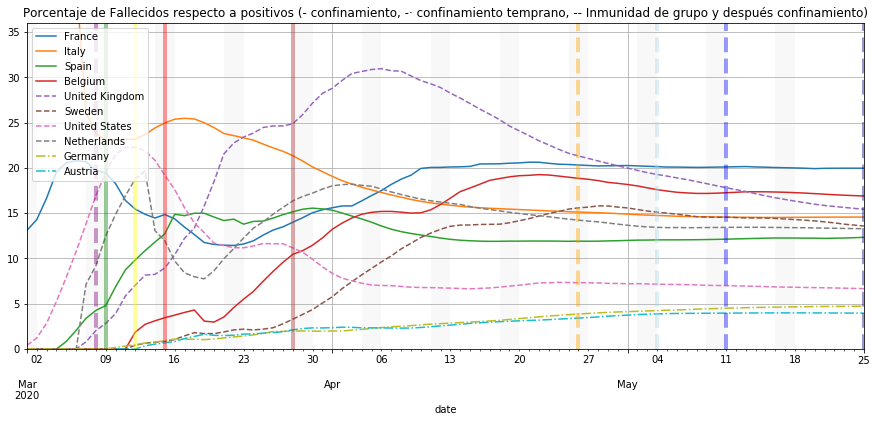

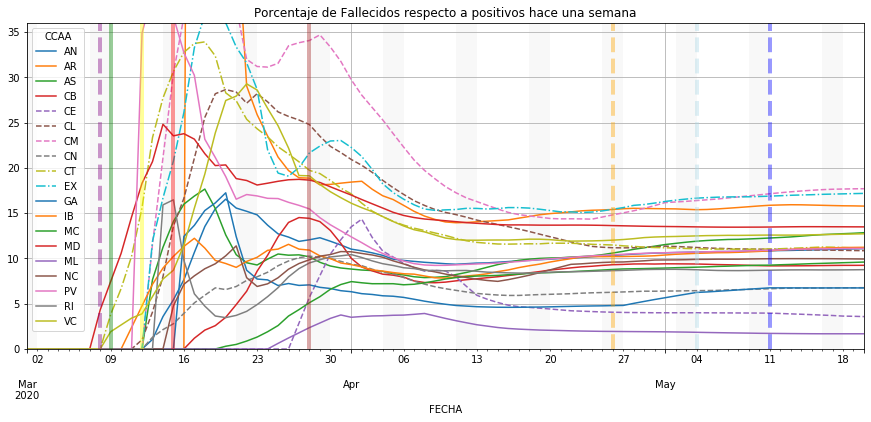

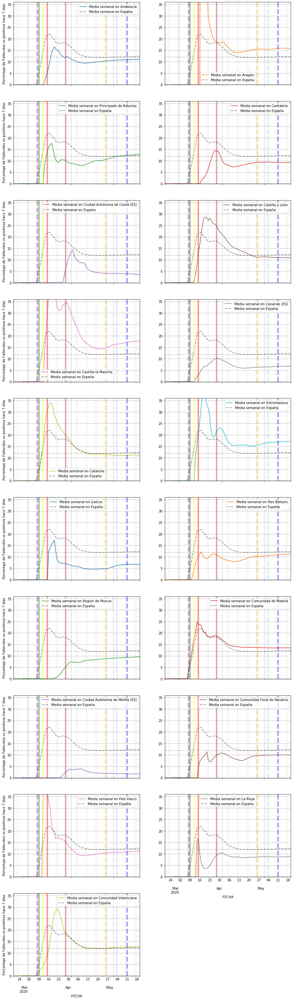

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC,España
FECHA,,,,,,,,,,,,,,,,,,,,
2020-05-16,10.963512,15.860489,12.622811,9.207645,3.743242,10.923770,17.587302,6.732690,11.258240,17.071391,6.740626,11.136193,9.452324,13.497353,1.680672,9.968541,11.058506,8.725947,12.626736,12.274795
2020-05-17,10.989061,15.832284,12.675369,9.223213,3.696952,10.904206,17.633944,6.743159,11.235091,17.097349,6.741524,11.165955,9.486893,13.491290,1.680672,9.963897,11.075678,8.729135,12.646251,12.144881
2020-05-18,11.020749,15.807837,12.726949,9.232199,3.632434,10.886810,17.657976,6.752580,11.202930,17.124557,6.742769,11.197197,9.525021,13.488030,1.680672,9.951295,11.090958,8.734174,12.669881,12.149308
2020-05-19,11.049887,15.796282,12.773786,9.232304,3.609441,10.868602,17.678586,6.760712,11.161930,17.151171,6.743396,11.211551,9.557251,13.483320,1.680672,9.940826,11.103383,8.742955,12.692662,12.161432
2020-05-20,11.077657,15.772878,12.838061,9.236583,3.577805,10.849066,17.692985,6.768860,11.091938,17.174573,6.739434,11.224316,9.595178,13.480561,1.680672,9.929093,11.104742,8.755609,12.714544,12.156441


In [34]:
fig, ax = plt.subplots(figsize=(15,6))
(100*owid_covid.loc[idx[lpaises,:],
               'total_deaths'].divide(
    owid_covid.loc[idx[lpaises,:],
               'total_cases'].shift(diasRetraso)).unstack(level=0).interpolate('index').rolling(7,center=False).mean()).loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines)
#owid_covid.loc[idx[lpaises],
#               'new_deaths_per_million'].unstack(level=0).interpolate('index').rolling(1,center=False).mean().loc[idx['2020-03-01':],lpaises].plot(ax=ax,style=llines,alpha=.2)


plt.legend(loc='upper left')
plt.title('Porcentaje de Fallecidos respecto a positivos (- confinamiento, -· confinamiento temprano, -- Inmunidad de grupo y después confinamiento)')
highlight_datetimes(weekend_indices, ax,items=True)

#plt.yscale('log')
plt.ylim(0,36)
plt.grid()
plt.show()

ktabla = (100*datos.Fallecidos.unstack(level=1).fillna(0).divide(
    datos.Total.unstack(level=1).shift(diasRetraso))).rolling(7,center=False).mean()#.loc[idx['2020-03-01':],:]
#ktabla = 100. * (datos.Fallecidos /
#    datos.Total.shift(diasRetraso)).unstack(level=1)
#ktabla = ktabla.fillna(0)
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.loc[idx['2020-03-01':],:].plot(ax=ax,style=llines)
plt.title('Porcentaje de Fallecidos respecto a positivos hace una semana')
highlight_datetimes(weekend_indices, ax,items=True)

#plt.yscale('log')
plt.ylim(0,36)
plt.grid()
plt.show()

#ktabla = ktabla.loc[idx['2020-03-01':,:]]

axes = ktabla.plot(subplots=True, 
           grid=True,
           figsize=(15, 60),
           layout=(10, 2))
ktabla.loc[:,u'España']= 100*datos.Fallecidos.unstack(level=1).sum(axis=1).divide(
    datos.Total.unstack(level=1).shift(diasRetraso).sum(axis=1)).loc[idx['2020-03-01':]]
ktabla = ktabla.fillna(0)

for kaxi in axes:
    try:
        #print(kaxi[0].legendlabels,poblacion.at[kaxi[0].legendlabels[0],'GEO'])
        
        #kaxi[0].plot(ktabla.index,ktabla[kaxi[0].legendlabels[0]],linestyle='--')#,label='No promediado'
        
        
        kaxi[0].set(ylabel='Porcentaje de Fallecidos vs positivos hace 7 días')
        #ktabla[kaxi[0].legendlabels[0]].plot(ax=kaxi[0],ls='--',c=kaxi[0].get_lines()[-1].get_color())
        ktabla[u'España'].interpolate('index').rolling(7,center=False).mean().plot(ax=kaxi[0],ls='--',linewidth=2, color='k',alpha=.4)
        
        kaxi[0].legend( ['Media semanal en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         #'Valor del día en ' + poblacion.at[kaxi[0].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[0].axhline(y=12,ls='-.',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')
        #owid_covid.loc[idx[lpaises,:],
        #       'new_cases_per_million'].unstack(level=0).interpolate('index').rolling(7,center=False).mean().loc[idx['2020-03-01':],'Spain'].plot(ax=kaxi[0],ls='--',linewidth=4, color='k',alpha=.4)

        highlight_datetimes(weekend_indices, kaxi[0],items=True)
        kaxi[0].grid()
        kaxi[0].set_ylim(0,36)


        #kaxi[1].legend( [poblacion.at[kaxi[1].legendlabels[0],'GEO']])
        #ktabla[kaxi[1].legendlabels[0]].plot(ax=kaxi[1],ls='--',c=kaxi[1].get_lines()[-1].get_color())
        ktabla[[u'España']].interpolate('index').rolling(7,center=False).mean().plot(ax=kaxi[1],ls='--',linewidth=2, color='k',alpha=.4)
        kaxi[1].legend( ['Media semanal en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         #'Valor del día en ' + poblacion.at[kaxi[1].legendlabels[0],'GEO'],
                         'Media semanal en España'
                        ])
        kaxi[1].axhline(y=12,ls='-.',linewidth=1, color='k',alpha=.4)#,label='Manifestación y Vox')
        highlight_datetimes(weekend_indices, kaxi[1],items=True)
        kaxi[1].grid()
        kaxi[1].set_ylim(0,36)


    except:
        continue

plt.show()    
ktabla.tail()

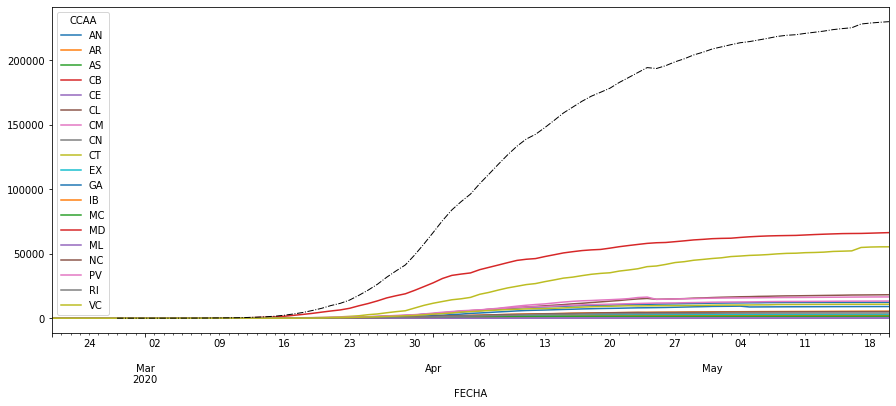

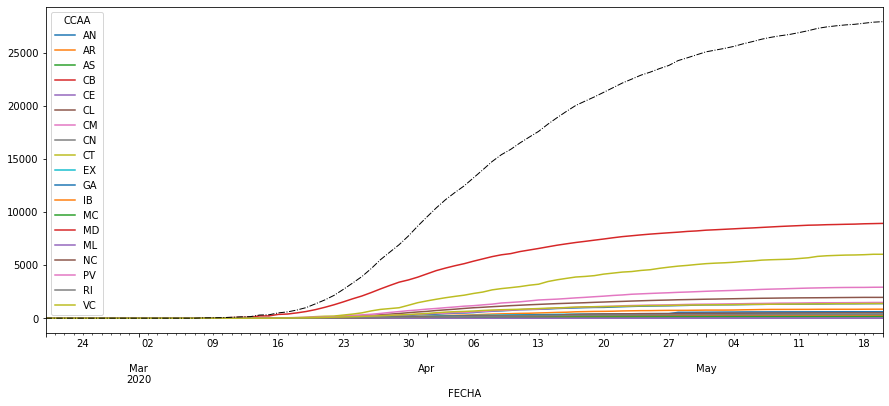

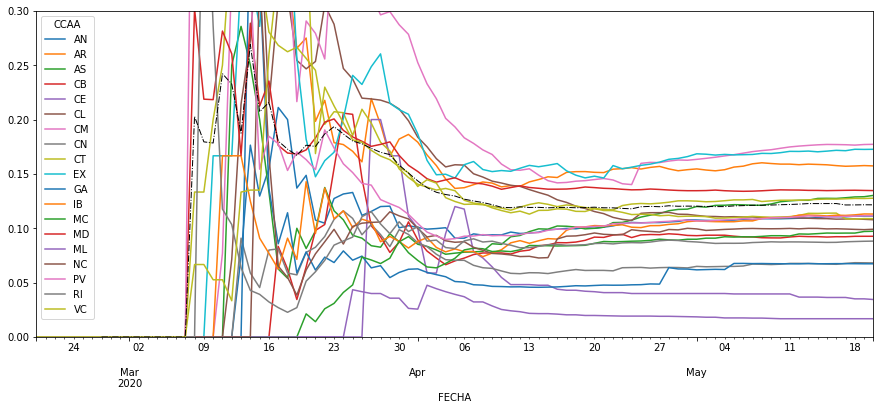

In [35]:
ktabla = datos.Total.unstack(level=1).shift(diasRetraso)#.divide(
    #datos.Total.unstack(level=1).shift(diasRetraso)) 
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.plot(ax=ax)
(kv.Total.shift(diasRetraso)).plot(ls='-.',linewidth=1, color='k',ax=ax)
#plt.ylim(0,.3)
plt.show()

ktabla = datos.Fallecidos.unstack(level=1)#.divide(
    #datos.Total.unstack(level=1).shift(diasRetraso))
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.plot(ax=ax)
(kv.Fallecidos).plot(ls='-.',linewidth=1, color='k',ax=ax)
#plt.ylim(0,.3)
plt.show()

ktabla = datos.Fallecidos.unstack(level=1).divide(
    datos.Total.unstack(level=1).shift(diasRetraso))
ktabla = ktabla.fillna(0)
fig, ax = plt.subplots(figsize=(15,6))
ktabla.plot(ax=ax)
(kv.Fallecidos/kv.Total.shift(diasRetraso)).plot(ls='-.',linewidth=1, color='k',ax=ax)
plt.ylim(0,.3)
plt.show()

In [36]:
ktabla.head(30)

CCAA,AN,AR,AS,CB,CE,CL,CM,CN,CT,EX,GA,IB,MC,MD,ML,NC,PV,RI,VC
FECHA,,,,,,,,,,,,,,,,,,,
2020-02-20,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-21,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-22,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-23,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-24,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-25,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-26,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-27,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
2020-02-28,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000


In [37]:
poblacion.Value.sum()

46937060

In [38]:
pd.read_html("https://docs.google.com/spreadsheets/d/e/2PACX-1vTkBWFjZ4hR39nf9QgPK2qDjiw_GriXoPPIluGas731ioIdmQhQthiJPUHl-ADibkZPT2KvFn4WvBrv/pubhtml#")[0]

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12
0,1.0,id_mapa,id_pdf,ccaa,poblacion,escala,21/05/2020,22/05/2020,23/05/2020,24/05/2020,22/05/2020,23/05/2020,24/05/2020
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.0,1,1,AndalucÃ­a,8446561,2,401,412,396,196,011,-016,-200
3,3.0,2,2,AragÃ³n,1324397,1,2607,2547,2501,2001,-060,-046,-500
4,4.0,3,3,Asturias,1019993,1,372,323,313,293,-049,-010,-020
5,5.0,4,4,Baleares,1198576,1,922,861,826,748,-061,-035,-078
6,6.0,5,5,Canarias,2220270,1,334,330,297,265,-004,-033,-032
7,7.0,6,6,Cantabria,581949,1,895,792,774,654,-103,-018,-120
8,8.0,8,7,Castilla-La Mancha,2038440,1,2917,2838,2686,1707,-079,-152,-979
9,9.0,7,8,Castilla y LeÃ³n,2402877,1,3992,3813,3488,2334,-179,-325,-1154


In [39]:
pd.read_csv('https://github.com/datadista/datasets/raw/master/COVID%2019/ccaa_covid19_confirmados_test.csv')

,cod_ine,CCAA,2020-02-21,2020-02-22,2020-02-23,2020-02-24,2020-02-25,2020-02-26,2020-02-27,2020-02-28,...,2020-05-12,2020-05-13,2020-05-14,2020-05-15,2020-05-16,2020-05-17,2020-05-18,2020-05-19,2020-05-20,2020-05-21
0,1,Andalucía,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3229,3312,3464,3667,3843,3982,3999,3999,3999,3999
1,2,Aragón,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1438,1484,1554,1583,1669,1699,1698,1751,1751,1751
2,3,Asturias,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,875,896,910,936,961,978,985,985,985,985
3,4,Baleares,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,105,106,106,106,105,105,105,106,106,107
4,5,Canarias,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
5,6,Cantabria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,445,477,483,498,505,505,503,509,510,519
6,8,Castilla La Mancha,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7620,7732,7861,8014,8189,8290,8366,8397,8546,8634
7,7,Castilla y León,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,6122,6157,6206,6226,6226,6226,6234,6285,6290,6291
8,9,Cataluña,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1643,1643,1643,1643,1643,1643,1643,1643,1643,1643
9,18,Ceuta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,59,59,59,59,59,59,59,59,59,59


In [45]:
Escovid19data = pd.read_csv('https://raw.githubusercontent.com/montera34/escovid19data/master/data/output/covid19-provincias-spain_consolidated.csv',
            index_col=[0,1],
            parse_dates=[0],
            infer_datetime_format=True,
            
           )

In [46]:
Escovid19data.tail().T

date                                                               2020-05-25  \
province                                                                Soria   
ine_code                                                                   42   
ccaa                                                          Castilla y León   
new_cases                                                                   3   
PCR                                                                       NaN   
TestAc                                                                    NaN   
activos                                                                   NaN   
hospitalized                                                               22   
intensive_care                                                              6   
deceased                                                                  119   
cases_accumulated                                                        2313   
cases_accumulated_PCR                                                     NaN   
recovered                                                                 402   
provincia_code                                                            NaN   
TestAc_cum                                                                NaN   
Fallecimientos_todos                                                      NaN   
poblacion                                                               88636   
cases_per_cienmil                                                     2609.55   
intensive_care_per_1000000                                               6.77   
deceassed_per_100000                                                   134.26   
hospitalized_per_100000                                                 24.82   
cases_14days                                                               46   
cases_7days                                                                19   
daily_cases                                                                 0   
daily_cases_avg7                                                            3   
daily_cases_PCR                                                           NaN   
daily_cases_PCR_avg7                                                      NaN   
daily_deaths                                                                0   
daily_deaths_inc                                                            0   
daily_deaths_avg3                                                           0   
daily_deaths_avg7                                                           0   
deaths_last_week                                                            0   
source_name                                          Junta de Castilla y León   
source                      https://analisis.datosabiertos.jcyl.es/explore...   
comments                                                                  NaN   

date                                                                           \
province                                                               Teruel   
ine_code                                                                   44   
ccaa                                                                   Aragón   
new_cases                                                                 NaN   
PCR                                                                       NaN   
TestAc                                                                    NaN   
activos                                                                   NaN   
hospitalized                                                              241   
intensive_care                                                             32   
deceased                                                                   86   
cases_accumulated                                                         NaN   
cases_accumulated_PCR                                                     601   
recovered                     

In [47]:
Escovid19data.xs('Barcelona',level='province').tail(4).T

date,2020-05-20,2020-05-21,2020-05-22,2020-05-23
ine_code,8,8,8,8
ccaa,Cataluña,Cataluña,Cataluña,Cataluña
new_cases,NaN,NaN,NaN,NaN
PCR,205,163,109,8
TestAc,28,21,24,NaN
activos,NaN,NaN,NaN,NaN
hospitalized,NaN,NaN,NaN,NaN
intensive_care,NaN,NaN,NaN,NaN
deceased,5913,5979,6001,6009
cases_accumulated,52048,52232,52365,52373


In [48]:
Escovid19data.groupby(['date','ccaa']).sum().xs('Cataluña',level='ccaa').tail(10).T

date,2020-05-14,2020-05-15,2020-05-16,2020-05-17,2020-05-18,2020-05-19,2020-05-20,2020-05-21,2020-05-22,2020-05-23
ine_code,93.00,93.00,93.00,93.00,93.00,93.00,93.00,93.00,93.00,93.00
new_cases,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
PCR,230.00,249.00,77.00,35.00,209.00,286.00,245.00,240.00,144.00,8.00
TestAc,53.00,34.00,6.00,1.00,33.00,41.00,60.00,47.00,38.00,2.00
activos,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
hospitalized,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
intensive_care,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
deceased,6809.00,6833.00,6860.00,6851.00,6891.00,6903.00,6946.00,7015.00,7042.00,7055.00
cases_accumulated,61487.00,61770.00,61853.00,61889.00,62131.00,62458.00,62763.00,63050.00,63232.00,58121.00
cases_accumulated_PCR,58241.00,58490.00,58567.00,58602.00,58811.00,59097.00,59342.00,59582.00,59726.00,55005.00


In [62]:
Escovid19data.columns

Index(['ine_code', 'ccaa', 'new_cases', 'PCR', 'TestAc', 'activos',
       'hospitalized', 'intensive_care', 'deceased', 'cases_accumulated',
       'cases_accumulated_PCR', 'recovered', 'provincia_code', 'TestAc_cum',
       'Fallecimientos_todos', 'poblacion', 'cases_per_cienmil',
       'intensive_care_per_1000000', 'deceassed_per_100000',
       'hospitalized_per_100000', 'cases_14days', 'cases_7days', 'daily_cases',
       'daily_cases_avg7', 'daily_cases_PCR', 'daily_cases_PCR_avg7',
       'daily_deaths', 'daily_deaths_inc', 'daily_deaths_avg3',
       'daily_deaths_avg7', 'deaths_last_week', 'source_name', 'source',
       'comments'],
      dtype='object')

In [54]:
kk = Escovid19data['daily_deaths'].index

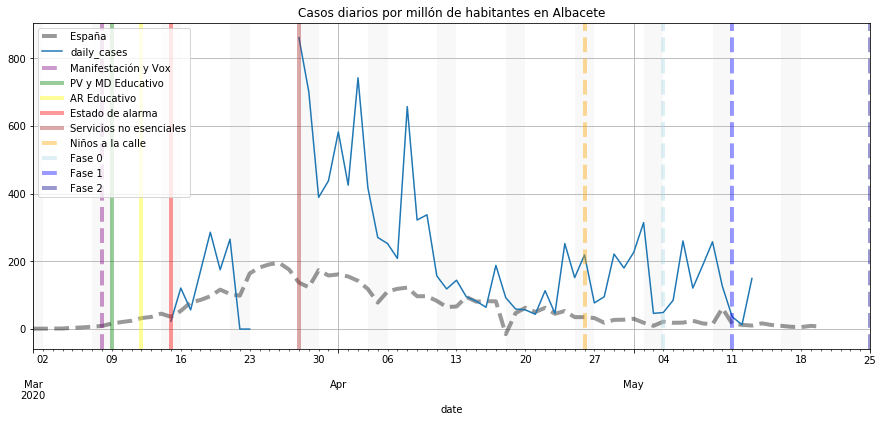

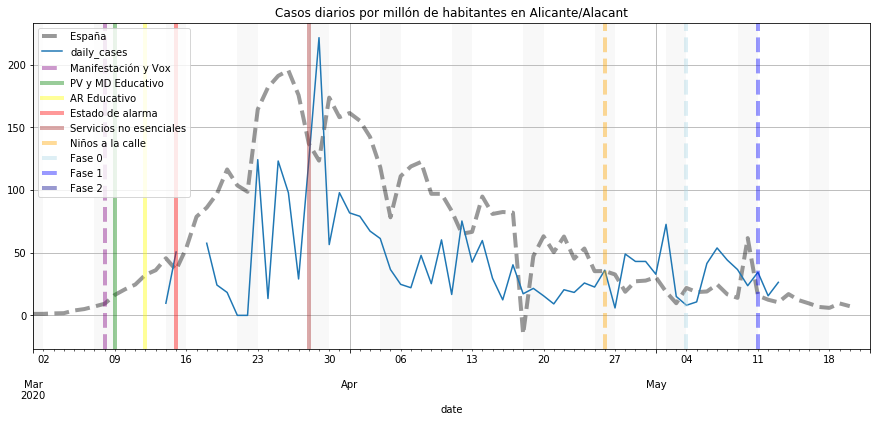

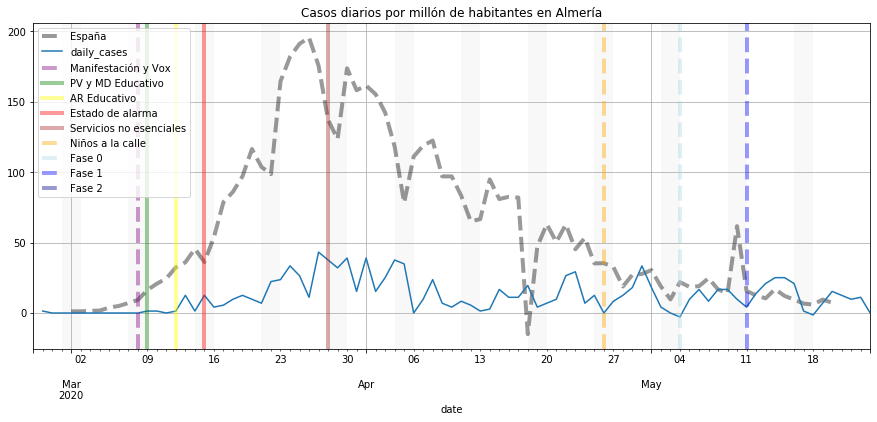

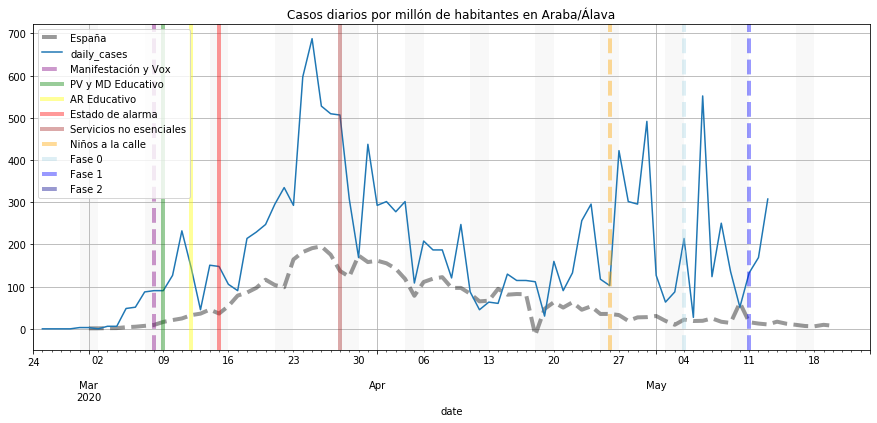

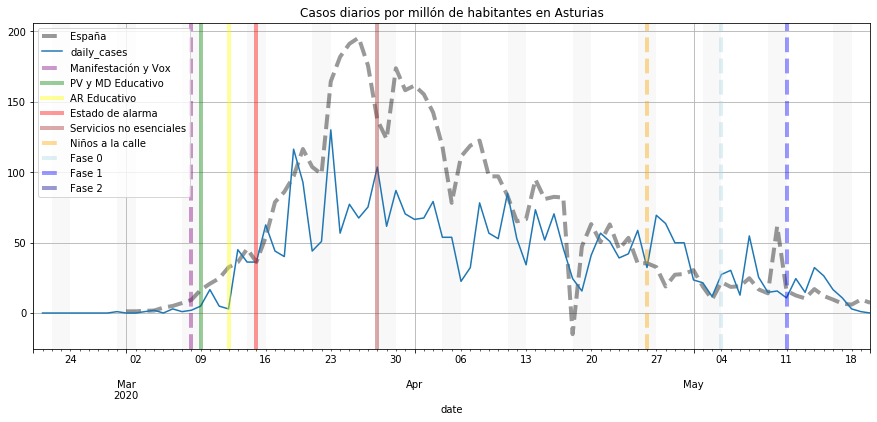

...

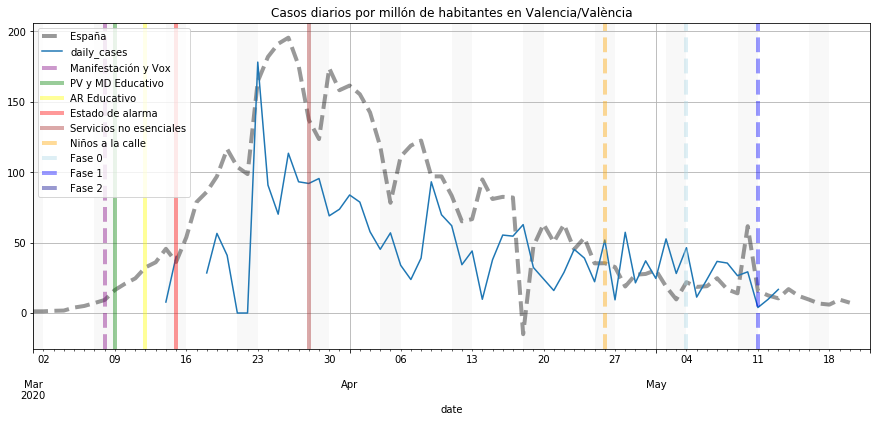

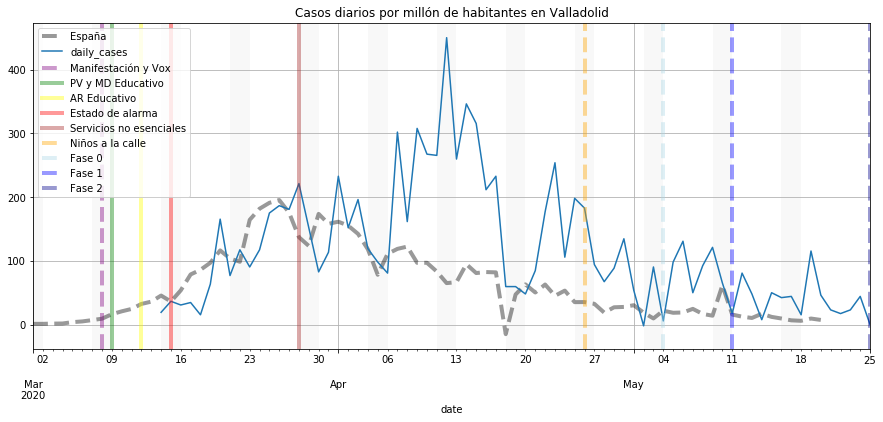

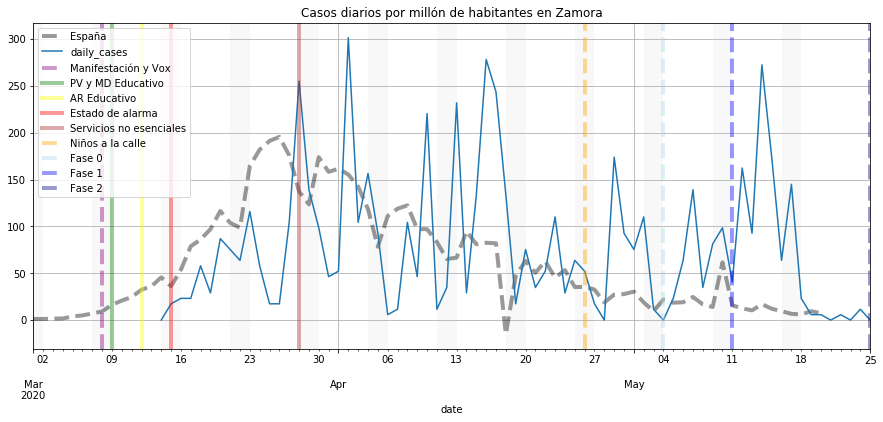

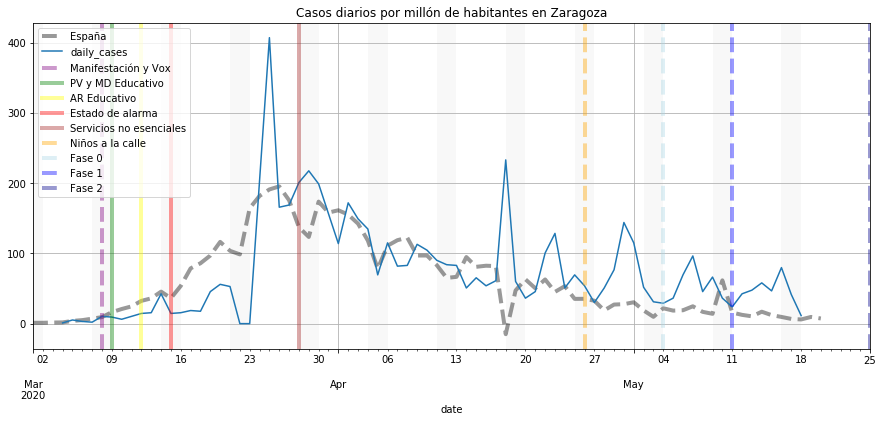

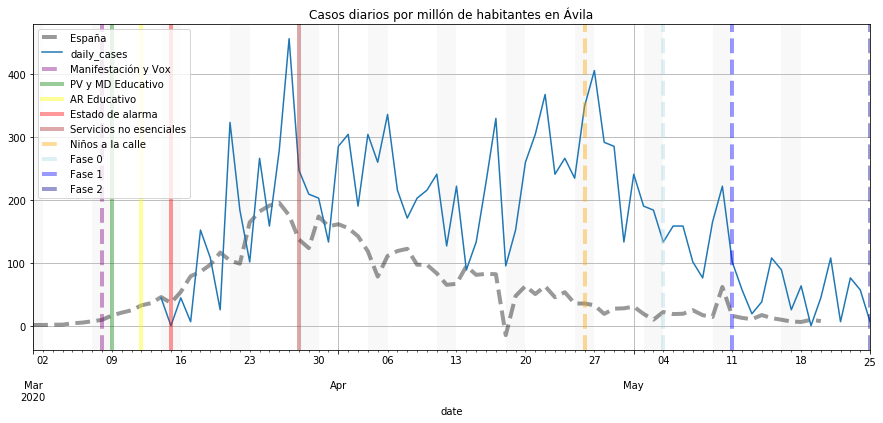

In [80]:
ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DTotal.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()


for k in kk.levels[1]:
    

    fig, ax = plt.subplots(figsize=(15,6))
    #ktabla[u'España'].rolling(7,center=True).mean().plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    ktabla[u'España'].plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    
    (1000000 * Escovid19data.xs(k,level='province')[['daily_cases']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax)
    
    #(kv.Fallecidos).plot(ls='-.',linewidth=1, color='k',ax=ax)
    #plt.ylim(0,.3)
    
    plt.title('Casos diarios por millón de habitantes en {}'.format(k))
    highlight_datetimes(weekend_indices, ax,items=True)

    plt.legend(loc='upper left')
    #plt.yscale('log')
    #plt.ylim(0,36)
    plt.grid()
    plt.show()


    plt.show()

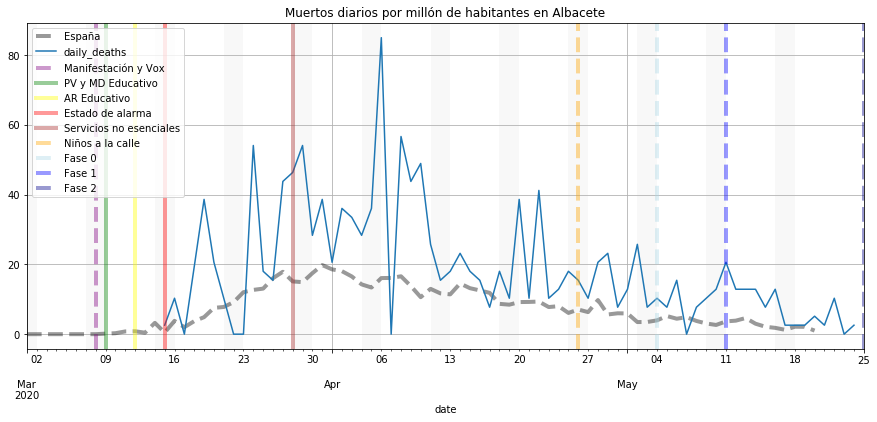

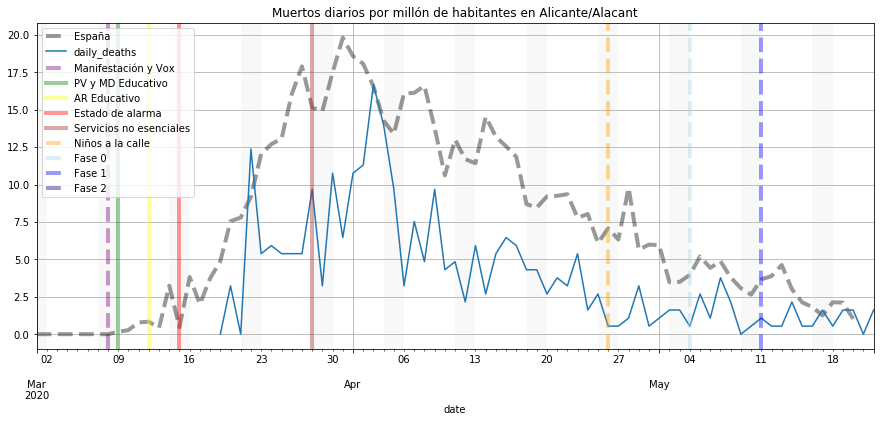

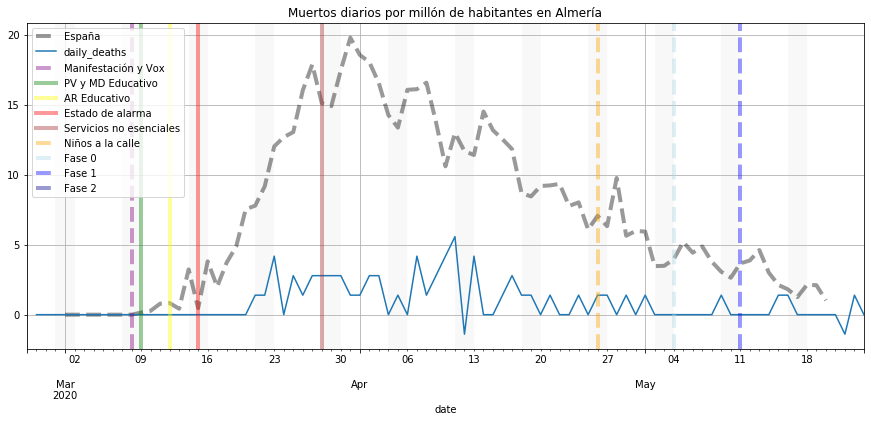

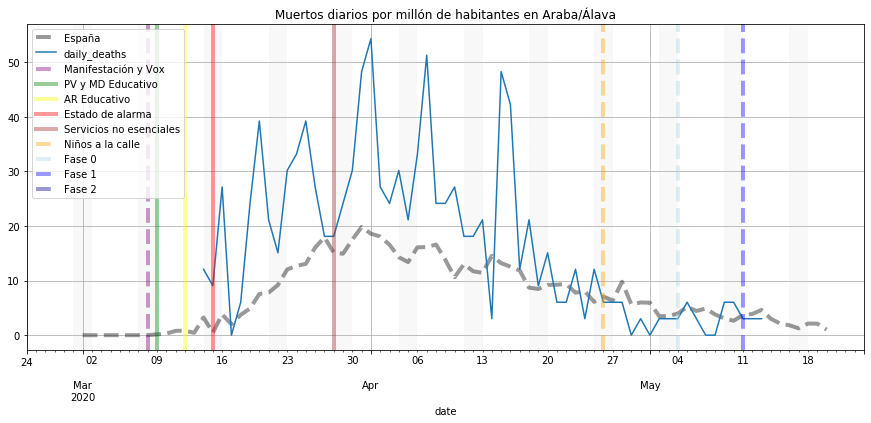

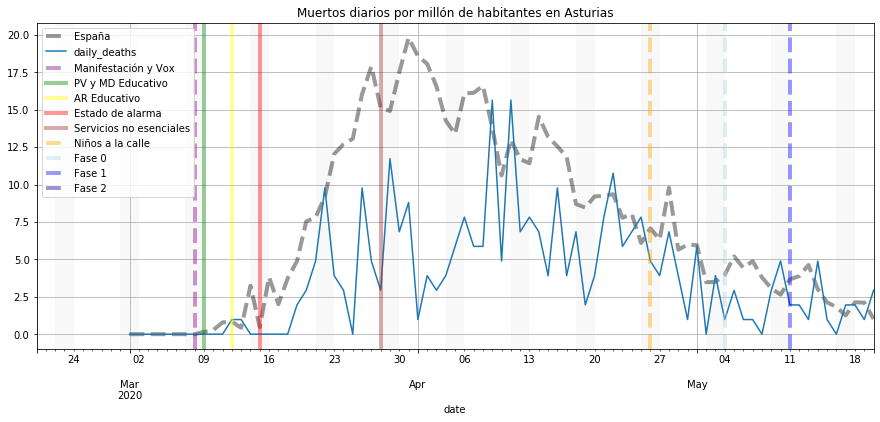

...

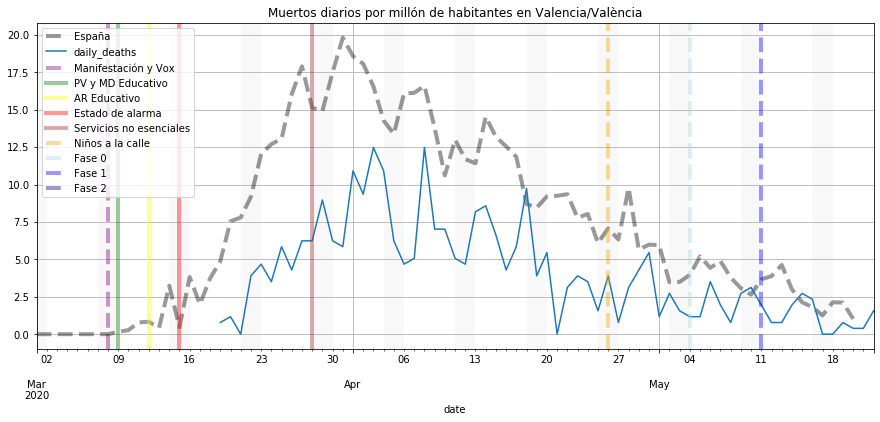

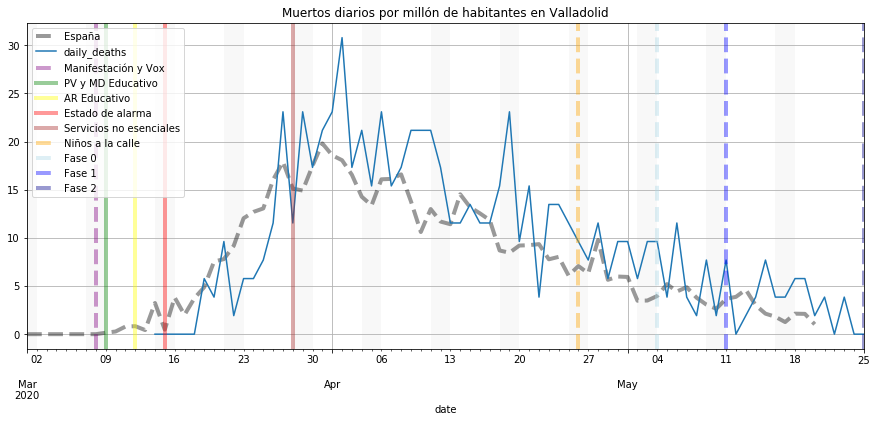

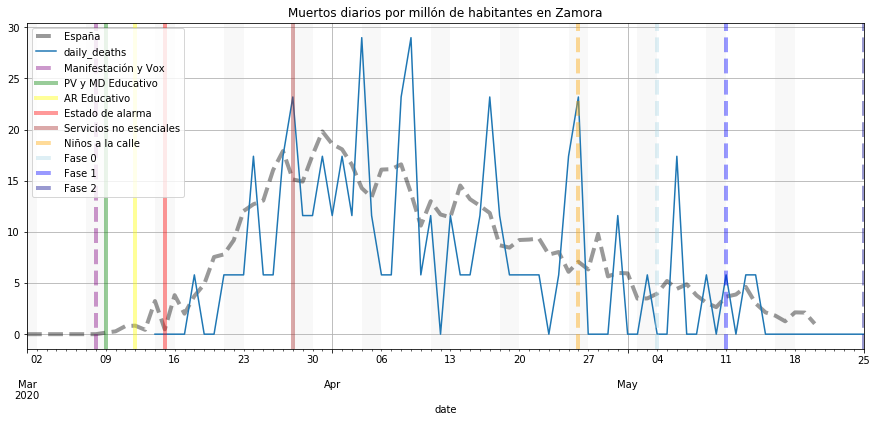

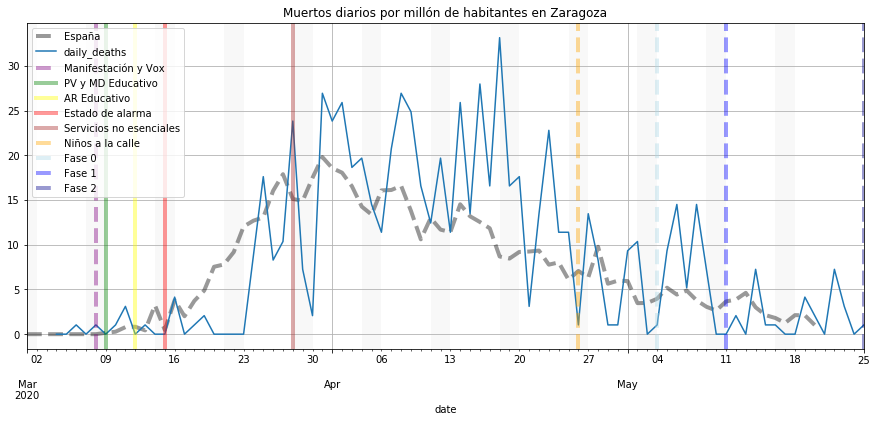

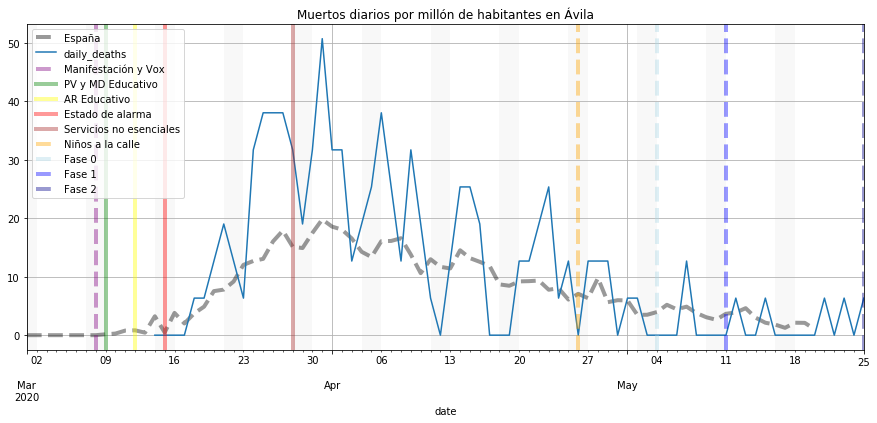

In [81]:
ktabla = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index').divide(poblacion.loc[fallecidos.columns,'Value'].to_dict(),axis=1)) 
ktabla.loc[:,u'España'] = (1000000*datos.loc[idx['2020-03-01':,:]].DFallecidos.unstack(level=1).interpolate('index')).sum(axis=1)/poblacion.loc[fallecidos.columns,'Value'].sum()


for k in kk.levels[1]:
    

    fig, ax = plt.subplots(figsize=(15,6))
    #ktabla[u'España'].rolling(7,center=True).mean().plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    ktabla[u'España'].plot(ax=ax,ls='--',linewidth=4, color='k',alpha=.4)
    
    (1000000 * Escovid19data.xs(k,level='province')[['daily_deaths']]/Escovid19data.xs(k,level='province')['poblacion'].values[-1]).plot(ax=ax)
    
    #(kv.Fallecidos).plot(ls='-.',linewidth=1, color='k',ax=ax)
    #plt.ylim(0,.3)
    
    plt.title('Muertos diarios por millón de habitantes en {}'.format(k))
    highlight_datetimes(weekend_indices, ax,items=True)
    plt.legend(loc='upper left')

    #plt.yscale('log')
    #plt.ylim(0,36)
    plt.grid()
    plt.show()


    plt.show()